# 0.a. Import and settings

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext rpy2.ipython

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
import scanpy as sc
from scanpy.plotting._tools.scatterplots import plot_scatter
import scanpy_scripts as ss
import bbknn

expr_cmap = ss.lib.expression_colormap(background_level=0.01)
doublet_cmap = ss.lib.expression_colormap(0.2)
np.set_printoptions(linewidth=180)
sc.settings.verbosity = 1
sc.settings.figdir = 'png'

In [3]:
import warnings
warnings.filterwarnings(action='ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

# 0.b. Define functions

In [5]:
def diffexp(
    adata, basis='umap', key=None, res=None, method='logreg',
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=None, **kwargs
):
    if key:
        grp_key = f'{key}_r{str(res).replace(".", "_")}'
        basis=f'{basis}_{key}'
    else:
        grp_key = f'r{str(res).replace(".", "_")}'
    de_tbl = ss.lib.diffexp(
        adata, key_added=grp_key, groupby=f'leiden_{grp_key}', method=method,
        filter_params=filter_params, **kwargs,
    )
    de_genes = list(de_tbl.groupby('cluster').head(4)['genes'].values)
    if extra_genes:
        de_genes.extend(extra_genes)
    rcParams.update({'figure.figsize': (4,4)})
    sc.pl.rank_genes_groups(adata, key=f'rank_genes_groups_{grp_key}', show=False)

    sc.pl.dotplot(
        adata,
        var_names=de_genes,
        groupby=f'leiden_{grp_key}',
        #standard_scale='var',
        show=False
    )

    rcParams.update({'figure.figsize':(2.5,2.5)})
    plot_scatter(
        adata, basis=basis, color_map=expr_cmap, use_raw=True, ncols=8, size=10, color=de_genes, show=False)
    rcParams.update({'figure.figsize':(3,3)})
    ss.lib.plot_embedding(adata, basis=basis, groupby=f'leiden_{grp_key}', size=20, show=False)
    return de_tbl

In [6]:
def update_diffexp(
    ad, basis='umap', key=None, res=None,
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=None,
):
    if key:
        grp_key = f'{key}_r{str(res).replace(".", "_")}'
        basis=f'{basis}_{key}'
    else:
        grp_key = f'r{str(res).replace(".", "_")}'
    de_key = f'rank_genes_groups_{grp_key}'
    if filter_params:
        sc.tl.filter_rank_genes_groups(
            ad,
            key=de_key,
            key_added=de_key + '_filtered',
            use_raw=True,
            **filter_params,
        )
    de_tbl = ss.lib.extract_de_table(ad.uns[de_key + '_filtered'])
    de_tbl = de_tbl.loc[de_tbl.genes.astype(str) != 'nan', :]

    de_genes = list(de_tbl.groupby('cluster').head(4)['genes'].values)
    if extra_genes:
        de_genes.extend(extra_genes)
    rcParams.update({'figure.figsize': (4,4)})
    sc.pl.rank_genes_groups(ad, key=f'rank_genes_groups_{grp_key}', show=False)

    sc.pl.dotplot(
        ad,
        var_names=de_genes,
        groupby=f'leiden_{grp_key}',
        #standard_scale='var',
        show=False
    )

    rcParams.update({'figure.figsize':(2.5,2.5)})
    plot_scatter(
        ad, basis=basis, color_map=expr_cmap, use_raw=True, ncols=8, size=10, color=de_genes, show=False)
    rcParams.update({'figure.figsize':(3,3)})
    ss.lib.plot_embedding(ad, basis=basis, groupby=f'leiden_{grp_key}', size=20, show=False)
    return de_tbl

In [4]:
def hex2rgba(hex_colors):
    return [tuple(int(h[i:i+2], 16)/255.0 for i in (1, 3, 5)) for h in hex_colors]

In [44]:
doublet_cmap = ss.lib.expression_colormap(0.1)
def check_doublets(
    ad, groupby, basis=None, p='bh_doublet_pval', score='scrublet_score', label='doublet', initial_pmin=0.05,
    upper_mad_only=(True, True), figsize=3.5, **kwargs
):
    if groupby not in ad.obs.columns:
        raise KeyError(f'{groupby} not found in `.obs`')
    ad.obs[label] = ad.obs[p] < initial_pmin
    doublet_freqs = ad.obs.groupby(groupby)[label].agg(lambda x: sum(x)/len(x))
    z_freq, p_freq, p_freq_adj = ss.lib.test_outlier(doublet_freqs, upper_mad_only=upper_mad_only)
    doublet_scores = ad.obs.groupby(groupby)[score].agg(lambda x: sum(x)/len(x))
    z_score, p_score, p_score_adj = ss.lib.test_outlier(doublet_scores, upper_mad_only=upper_mad_only)

    thresholds = {'min_score': max(doublet_scores)/2, 'min_freq': max(doublet_freqs)/2, 'max_p_score': 0.05, 'max_p_freq': 0.05}
    for k in thresholds:
        if k in kwargs:
            thresholds[k] = kwargs[k]
            del kwargs[k]

    if basis and f'X_{basis}' in ad.obsm.keys():
        ss.lib.set_figsize((figsize, figsize))
        plot_scatter(ad, basis=basis, color=[score, label, groupby], color_map=doublet_cmap, **kwargs)

    ss.lib.set_figsize((figsize*2,figsize-0.5))
    sc.pl.violin(ad, keys=[p, score], groupby=groupby)
    colors = hex2rgba(ad.uns[f'{groupby}_colors'])
    df = pd.DataFrame({'score': doublet_scores, 'p_score': p_score, 'freq': doublet_freqs, 'p_freq': p_freq})
    fig, ax = plt.subplots(ncols=2)
    df.plot(kind='scatter', x='p_score', y='p_freq', c=colors, ax=ax[0])
    ax[0].set_xlim((-0.02, 0.5))
    ax[0].set_ylim((-0.02, 0.5))
    ax[0].hlines(thresholds['max_p_freq'], xmin=0, xmax=1, linestyle='--', linewidth=1)
    ax[0].vlines(thresholds['max_p_score'], ymin=0, ymax=1, linestyle='--', linewidth=1)
    df.plot(kind='scatter', x='score', y='freq', c=colors, ax=ax[1])
#     ax[1].set_xlim((-1, 10))
#     ax[1].set_ylim((-0.02, 0.5))
    ax[1].hlines(thresholds['min_freq'], xmin=min(doublet_scores), xmax=max(doublet_scores), linestyle='--', linewidth=1)
    ax[1].vlines(thresholds['min_score'], ymin=min(doublet_freqs), ymax=max(doublet_freqs), linestyle='--', linewidth=1)
    for i in range(len(p_freq)):
        ax[0].annotate(i, xy=(df.p_score[i], df.p_freq[i]))
        ax[1].annotate(i, xy=(df.score[i], df.freq[i]))
    ss.lib.set_figsize((3.5, 3.5))
    return df

# 1. Load data

In [6]:
CATEGORY_NAME = 'B-cells'
CATEGORY_CLUSTER_ID = 3
MIN_BATCH_SIZE = 10
DE_METHOD = 't-test_overestim_var'
DE_FILTERS = {'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 1.5}
KNOWN_MARKERS = ['MS4A1']
CLUSTER_RESOLUTIONS = [0.1, 0.2, 0.3, 0.4, 0.5]

In [9]:
fetal_ad = sc.read('data/h5ad/fetal_skin_raw.h5ad', mode='r')

In [10]:
spleen_samples = ['F69-GEX_1_SPL_45P', 'F69-GEX_2_SPL_45N', 'F69-GEX_3_SPL_45N']

In [11]:
fetal_ad = fetal_ad[~fetal_ad.obs['sample'].isin(spleen_samples), :]

In [ ]:
fetal_ad

In [12]:
g1_s = pd.read_csv('data/misc/G1-S_genes.list', header=None, names=['gene'])
g2_m = pd.read_csv('data/misc/G2-M_genes.list', header=None, names=['gene'])
jp_cc = pd.read_csv('data/misc/JP_cycle_genes.list', header=None, names=['gene'])

In [13]:
cc_genes = list(pd.concat([g1_s, g2_m, jp_cc]).gene.values)

In [14]:
fetal_ad.var['cc'] = fetal_ad.var_names.isin(cc_genes)

In [15]:
annot = pd.read_csv('fetal_annotation_rachel-201904.txt', sep='\t', header=None, names=['index', 'annot'], index_col=0)

In [16]:
fetal_ad.obs['annot'] = fetal_ad.obs.merge(annot, how='left', left_index=True, right_index=True)['annot']

In [17]:
fetal_ad.obs['doublet'] = fetal_ad.obs['bh_doublet_pval'] < 0.1

In [18]:
hierarchy1 = pd.read_csv('hierarchy1.txt', sep='\t', index_col=0)

In [19]:
fetal_ad.obs = fetal_ad.obs.merge(hierarchy1, how='left', left_index=True, right_index=True)

In [20]:
ad = fetal_ad[(fetal_ad.obs['hierarchy1'] == 3), :]

In [21]:
ad.obs['sample'].value_counts()

F38_male_12PCW        850
F51_SK_CD45P_5        642
F51_SK_CD45P_6        561
F45_female_13+6PCW    406
F71-GEX_2_SKI_45P     347
F71-GEX_1_SKI_45P     340
F50_SK_CD45P_6        218
F41_female_16PCW      204
F33_female_9+5PCW     124
F69-GEX_4_SKI_45P     124
F50_SK_CD45P_5        115
F35_female_7+6PCW      54
F16_male_8+1PCW        23
F19_female_10+2PCW     22
F32_female_7+6PCW      11
F61_SK_CD45P_1          9
F34_female_8+1PCW       7
F71-GEX_3_SKI_45N       3
F17_male_9+1PCW         3
F71-GEX_5_SKI_45en      3
F69-GEX_7_SKI_45en      2
F71-GEX_4_SKI_45N       1
F51_SK_CD45N_2          1
Name: sample, dtype: int64

In [22]:
sample_sizes = ad.obs['sample'].value_counts()

In [23]:
valid_batches = sample_sizes[sample_sizes >= 10].index.to_list()

In [24]:
ad = ad[ad.obs['sample'].isin(valid_batches), :]

In [25]:
ad

View of AnnData object with n_obs × n_vars = 4041 × 33694 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1'
    var: 'gene_ids', 'cc'

In [26]:
ad.write('data/h5ad/fetal_skin_hierarch1_B-cells.h5ad', compression='gzip')

... storing 'annot' as categorical


# 2. QC

In [7]:
ad = sc.read('data/h5ad/fetal_skin_hierarch1_B-cells.h5ad')

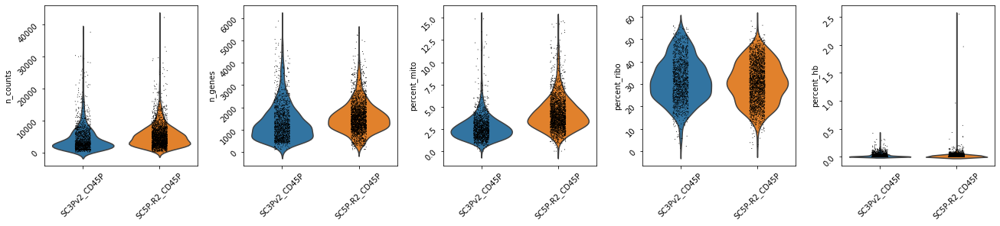

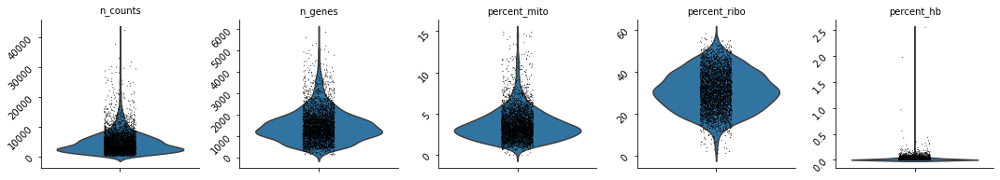

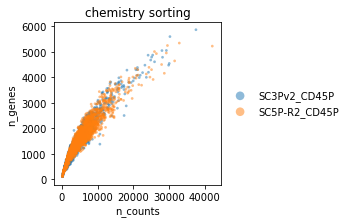

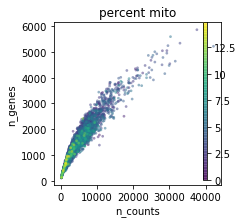

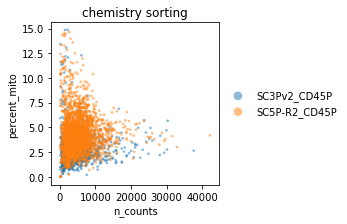

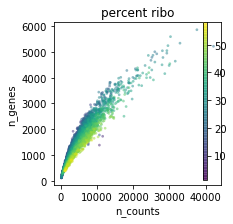

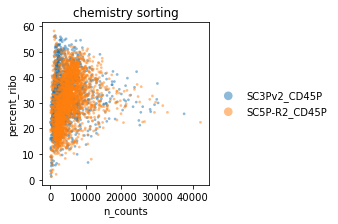

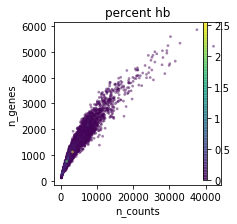

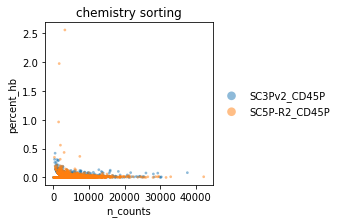

AnnData object with n_obs × n_vars = 4041 × 33694 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells'
    uns: 'chemistry_sorting_colors'

In [27]:
rcParams.update({'figure.figsize': (4,4)})
ss.lib.simple_default_pipeline(ad, qc_only=True, batch='chemistry_sorting')

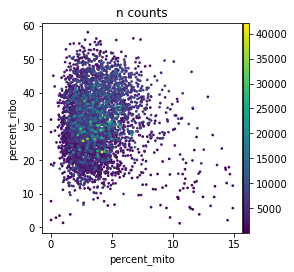

In [28]:
rcParams.update({'figure.figsize': (4,4)})
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='n_counts')

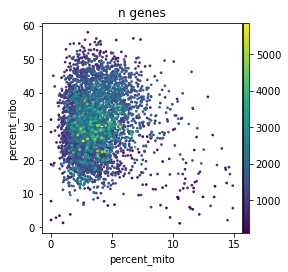

In [29]:
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='n_genes')

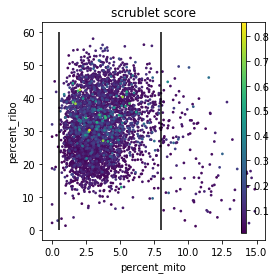

In [32]:
fig, ax = plt.subplots()
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='scrublet_score', ax=ax, show=False)
ax.vlines(x=[0.5, 8], ymin=0, ymax=60)

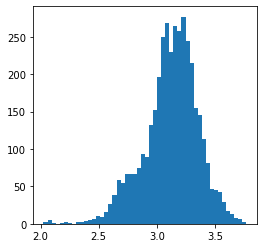

In [33]:
_ = plt.hist(np.log10(ad.obs.loc[(ad.obs.percent_mito>0.5)&(ad.obs.percent_mito<=8),'n_genes']), bins=50)

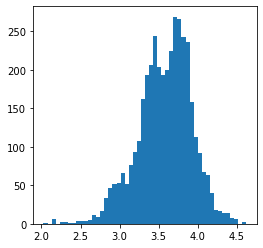

In [34]:
_ = plt.hist(np.log10(ad.obs.loc[(ad.obs.percent_mito>0.5)&(ad.obs.percent_mito<=8),'n_counts']), bins=50)

# 3. Default preprocessing

In [35]:
ad = ad[
    (ad.obs.percent_mito>=0.5) &
    (ad.obs.percent_mito<8) &
    (ad.obs.n_genes>=300) &
    (ad.obs.n_counts>=400) &
    (ad.obs.percent_hb<2.5), :]
ad = ad[:, (ad.var.n_cells>=3)]

In [36]:
ad

View of AnnData object with n_obs × n_vars = 3862 × 16569 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells'

In [37]:
ad1 = ad.copy()[:, ~(ad.var.mito | ad.var.hb | ad.var.ribo)]
ad2 = ad.copy()[:,~(ad.var.mito | ad.var.hb | ad.var.ribo | ad.var.cc)]

In [38]:
ss.lib.simple_default_pipeline(
    ad1,
    filter_params=None,
    hvg_params={'flavor': 'seurat', 'by_batch': ['chemistry', 2]},
    scale_params={'max_value': 10},
    pca_params={'n_comps': 50, 'svd_solver': 'arpack', 'use_highly_variable': True},
    harmony_params=None,
    nb_params={'use_rep': 'X_pca', 'key_added': 'orig'},
    umap_params={'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    leiden_params={'resolution': [0.1, 0.2, 0.3, 0.4], 'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 3862 × 16446 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'neighbors', 'leiden'
    obsm: 'X_pca', 'X_umap_orig'
    varm: 'PCs'

In [39]:
ss.lib.simple_default_pipeline(
    ad2,
    filter_params=None,
    hvg_params={'flavor': 'seurat', 'by_batch': ['chemistry', 2]},
    scale_params={'max_value': 10},
    pca_params={'n_comps': 50, 'svd_solver': 'arpack', 'use_highly_variable': True},
    harmony_params=None,
    nb_params={'use_rep': 'X_pca', 'key_added': 'orig'},
    umap_params={'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    leiden_params={'resolution': [0.1, 0.2, 0.3, 0.4], 'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 3862 × 15885 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'neighbors', 'leiden'
    obsm: 'X_pca', 'X_umap_orig'
    varm: 'PCs'

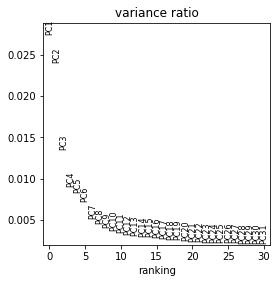

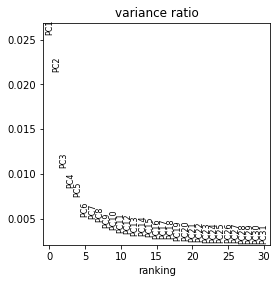

In [40]:
rcParams.update({'figure.figsize': (4,4)})
sc.pl.pca_variance_ratio(ad1, n_pcs=30)
sc.pl.pca_variance_ratio(ad2, n_pcs=30)

In [41]:
k_annot = (ad1.obs['annot'] != 'nan').values
ad1.obs['lr_annot'] = ss.lib.LR_annotate(ad1, train_label=ad1.obs['annot'].values, train_x=ad1.obsm['X_pca'],
                                        subset=k_annot, use_rep='X_pca', return_label=True)
ad1.obs['lr_annot'] = ad1.obs['lr_annot'].astype('category')

In [42]:
k_annot = (ad2.obs['annot'] != 'nan').values
ad2.obs['lr_annot'] = ss.lib.LR_annotate(ad2, train_label=ad2.obs['annot'].values, train_x=ad2.obsm['X_pca'],
                                        subset=k_annot, use_rep='X_pca', return_label=True)
ad2.obs['lr_annot'] = ad2.obs['lr_annot'].astype('category')

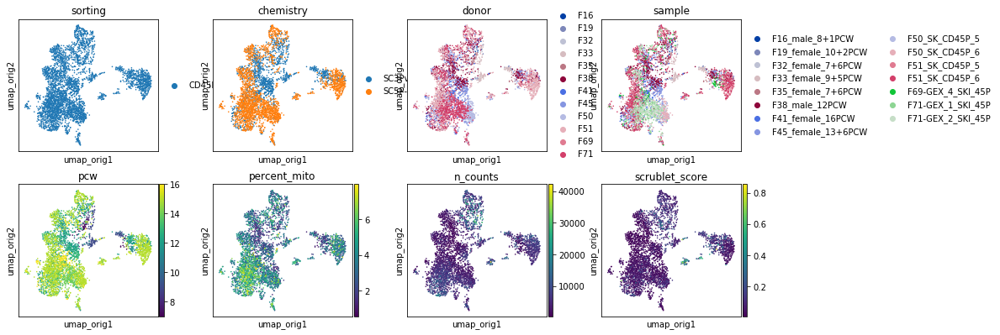

In [44]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_orig',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'], size=10)

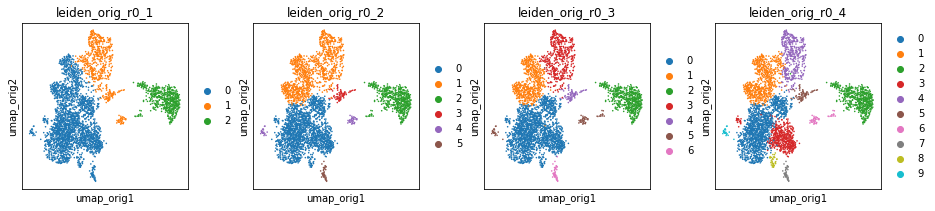

In [45]:
plot_scatter(ad1, basis='umap_orig', color_map=expr_cmap,
             color=[f'leiden_orig_r{str(res).replace(".", "_")}' for res in [0.1, 0.2, 0.3, 0.4]], size=10, ncols=4)

In [47]:
doublet_freq = ad1.obs.groupby('leiden_orig_r0_4')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                      freq         p
leiden_orig_r0_4                    
0                 0.000710  0.750000
1                 0.007278  0.750000
2                 0.017153  0.255219
3                 0.003724  0.750000
4                 0.023981  0.058668
5                 0.013333  0.421143
6                 0.104167  0.000000
7                 0.000000  0.750000
8                 0.000000  0.750000
9                 0.000000  0.750000


In [48]:
doublet_freq = ad1.obs.groupby('leiden_orig_r0_4')['scrublet_score'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

                     score         p
leiden_orig_r0_4                    
0                 0.052894  0.759331
1                 0.044341  0.759331
2                 0.089159  0.068064
3                 0.051543  0.759331
4                 0.116581  0.001448
5                 0.116177  0.001448
6                 0.342509  0.000000
7                 0.040380  0.759331
8                 0.038693  0.759331
9                 0.039833  0.759331


In [ ]:
orig_de_genes1 = diffexp(
    ad1, basis='umap', key='orig', res=0.4, method='logreg',
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['CD19', 'MS4A1', 'CDK1']
)
orig_de_genes1.groupby('cluster').head(5)

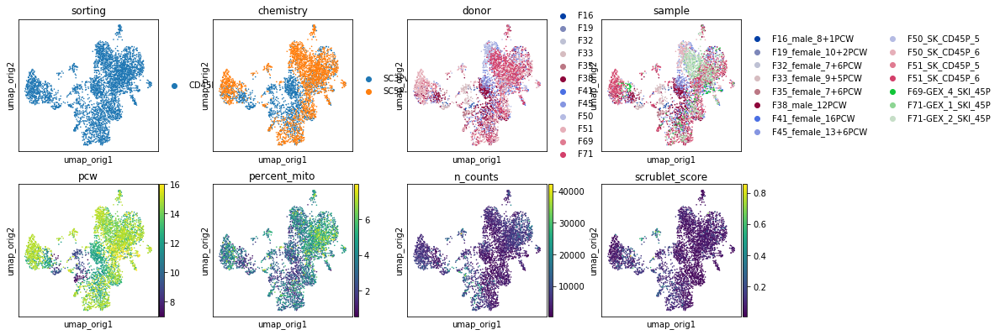

In [49]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad2, basis='umap_orig',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'], size=10)

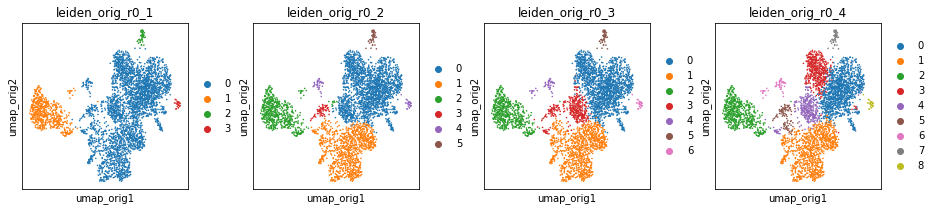

In [50]:
plot_scatter(ad2, basis='umap_orig', color_map=expr_cmap,
             color=[f'leiden_orig_r{str(res).replace(".", "_")}' for res in [0.1, 0.2, 0.3, 0.4]], size=10, ncols=4)

In [51]:
doublet_freq = ad2.obs.groupby('leiden_orig_r0_4')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                      freq        p
leiden_orig_r0_4                   
0                 0.000820  0.78915
1                 0.010000  0.78915
2                 0.016722  0.78915
3                 0.004141  0.78915
4                 0.009091  0.78915
5                 0.009524  0.78915
6                 0.137255  0.00000
7                 0.000000  0.78915
8                 0.000000  0.78915


In [52]:
doublet_freq = ad2.obs.groupby('leiden_orig_r0_4')['scrublet_score'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

                     score         p
leiden_orig_r0_4                    
0                 0.054489  0.764149
1                 0.066362  0.728191
2                 0.090303  0.154487
3                 0.052151  0.764149
4                 0.057023  0.764149
5                 0.111216  0.017839
6                 0.332913  0.000000
7                 0.040976  0.784120
8                 0.043256  0.784120


In [ ]:
orig_de_genes2 = diffexp(
    ad2, basis='umap', key='orig', res=0.4, method='logreg'
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['CD19', 'MS4A1']
)
orig_de_genes2.groupby('cluster').head(5)

# 4.1 Harmony

In [53]:
ss.lib.simple_default_pipeline(
    ad1,
    filter_params=None, norm_params=None, hvg_params=None, scale_params=None, pca_params=None,
#     harmony_params=None,
    harmony_params={'batch': 'sample'},
    nb_params={'use_rep': 'X_pca_hm', 'key_added': 'hm'},
    umap_params={'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    leiden_params={'resolution': [0.1, 0.2, 0.3, 0.4], 'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 3862 × 16446 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_hm', 'neighbors'
    obsm: 'X_pca', 'X_umap_orig', 'X_pca_hm', 'X_umap_hm'
    varm: 'PCs'

In [54]:
ss.lib.simple_default_pipeline(
    ad2,
    filter_params=None, norm_params=None, hvg_params=None, scale_params=None, pca_params=None,
#     harmony_params=None,
    harmony_params={'batch': 'sample'},
    nb_params={'use_rep': 'X_pca_hm', 'key_added': 'hm'},
    umap_params={'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    leiden_params={'resolution': [0.1, 0.2, 0.3, 0.4], 'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 3862 × 15885 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_hm', 'neighbors'
    obsm: 'X_pca', 'X_umap_orig', 'X_pca_hm', 'X_umap_hm'
    varm: 'PCs'

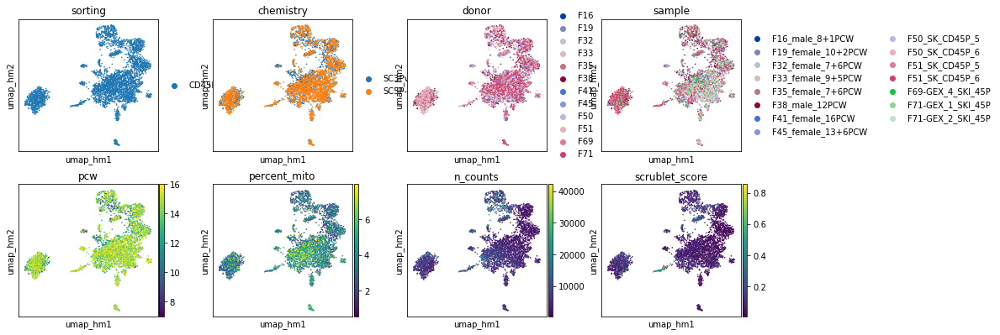

In [58]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_hm',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'], size=10)

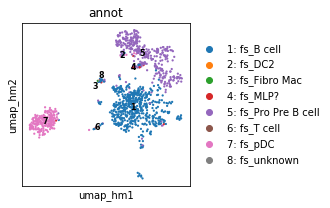

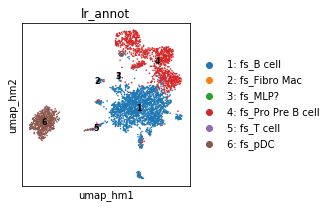

In [94]:
rcParams.update({'figure.figsize':(3,3)})
k_annot = (ad1.obs['annot'] != 'nan').values
ss.lib.plot_embedding(ad1[k_annot, :], basis='umap_hm', groupby='annot', size=20)
ss.lib.plot_embedding(ad1, basis='umap_hm', groupby='lr_annot', size=10)

In [62]:
ss.lib.leiden(ad1, use_graph='neighbors_hm', key_added='hm', resolution=[0.5, 0.6, 0.7])

AnnData object with n_obs × n_vars = 3862 × 16446 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', 'leiden_hm_r0_6', 'leiden_hm_r0_7'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_hm', 'neighbors', 'leiden_hm_r0_1_colors', 'leiden_hm_r0_2_colors', 'leiden_hm_r0_3_colors', 'leiden_hm_r0_4_

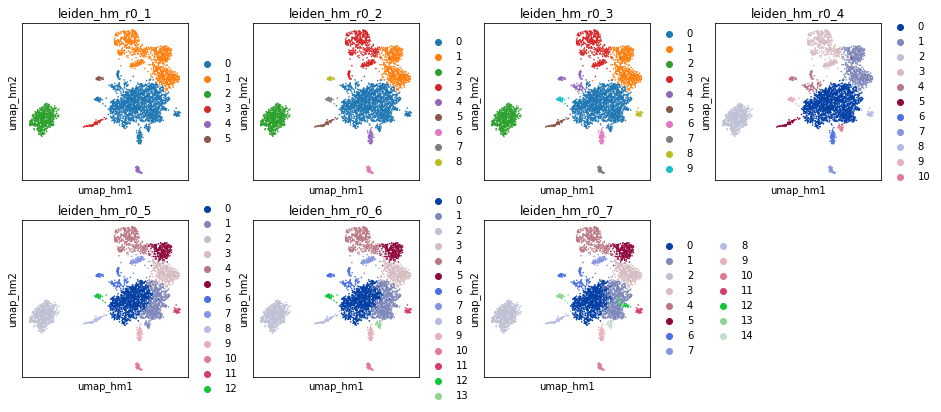

In [10]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_hm', color=[f'leiden_hm_r0_{i}' for i in (1,2,3,4,5,6,7)], size=10)

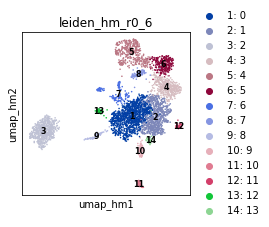

In [12]:
ss.lib.plot_embedding(ad1, basis='umap_hm', groupby='leiden_hm_r0_6', size=10)

In [72]:
doublet_freq = ad1.obs.groupby('leiden_hm_r0_3')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                    freq             p
leiden_hm_r0_3                        
0               0.001091  7.500003e-01
1               0.004622  6.766828e-01
2               0.017301  8.099281e-04
3               0.017391  8.099281e-04
4               0.027778  9.980025e-09
5               0.133333  0.000000e+00
6               0.000000  7.500003e-01
7               0.000000  7.500003e-01
8               0.000000  7.500003e-01
9               0.000000  7.500003e-01


In [73]:
doublet_freq = ad1.obs.groupby('leiden_hm_r0_3')['scrublet_score'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

                   score         p
leiden_hm_r0_3                    
0               0.053070  0.766920
1               0.037759  0.766920
2               0.087009  0.064565
3               0.113421  0.001809
4               0.109377  0.002622
5               0.317561  0.000000
6               0.041769  0.766920
7               0.039757  0.766920
8               0.049284  0.766920
9               0.043400  0.766920


,cluster,ref,rank,genes,scores,logfoldchanges,pvals,pvals_adj
19,0,rest,19,SP140,16.210489,2.002110,1.204346e-55,6.829887e-53
29,0,rest,29,NR4A3,14.773646,1.899686,6.559435e-47,2.295244e-44
34,0,rest,34,COTL1,14.214040,1.935309,1.291100e-43,3.660937e-41
16447,1,rest,1,HSPA1B,20.895473,3.791420,7.665497e-82,6.303338e-78
16453,1,rest,7,ZFAND2A,15.868867,2.725606,3.969045e-51,8.159364e-48
16462,1,rest,16,RHOB,12.868196,2.373882,2.264056e-35,1.861733e-32
32892,2,rest,0,TYROBP,71.080170,6.597109,0.000000e+00,0.000000e+00
32893,2,rest,1,GZMB,59.381260,9.193916,1.380158e-262,5.674521e-259
32895,2,rest,3,SERPINF1,50.159081,5.762007,7.664195e-266,4.201511e-262
32896,2,rest,4,CD7,48.473934,6.014503,1.580804e-254,5.199579e-251


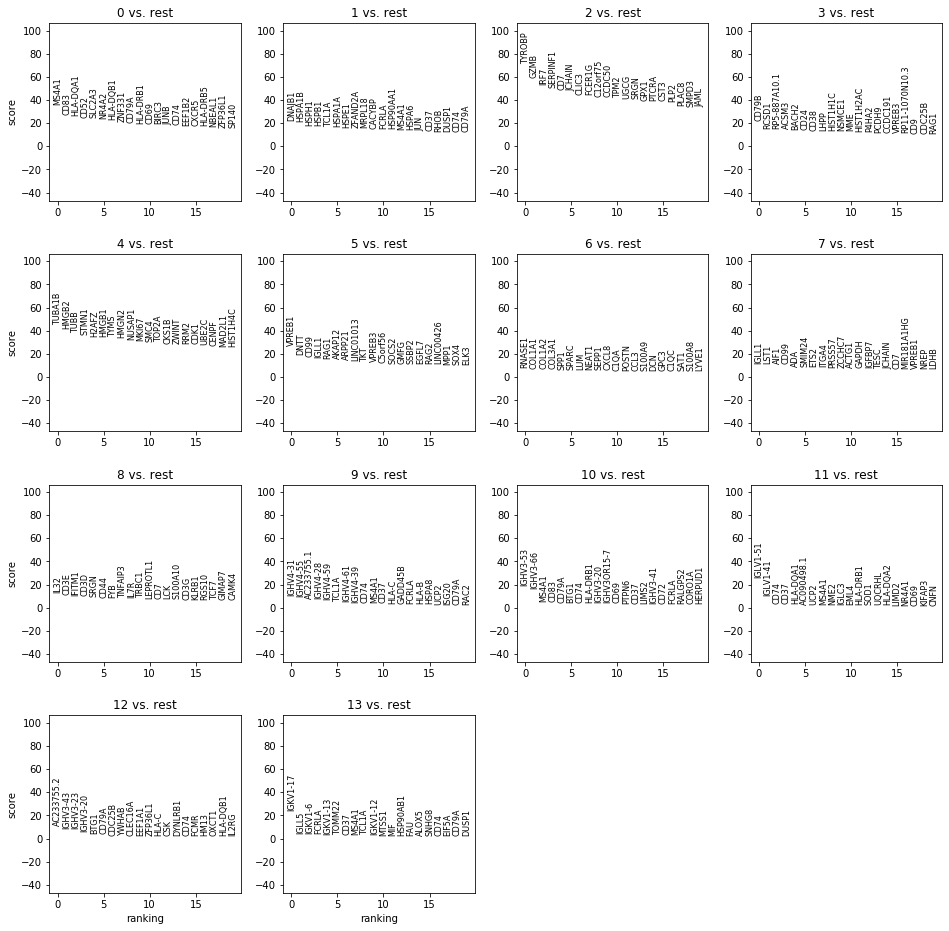

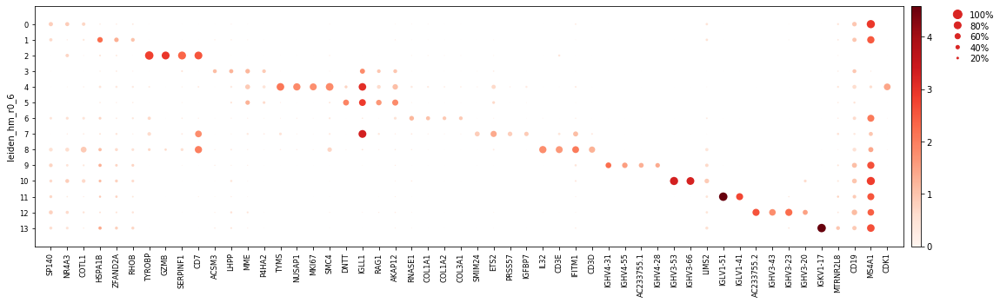

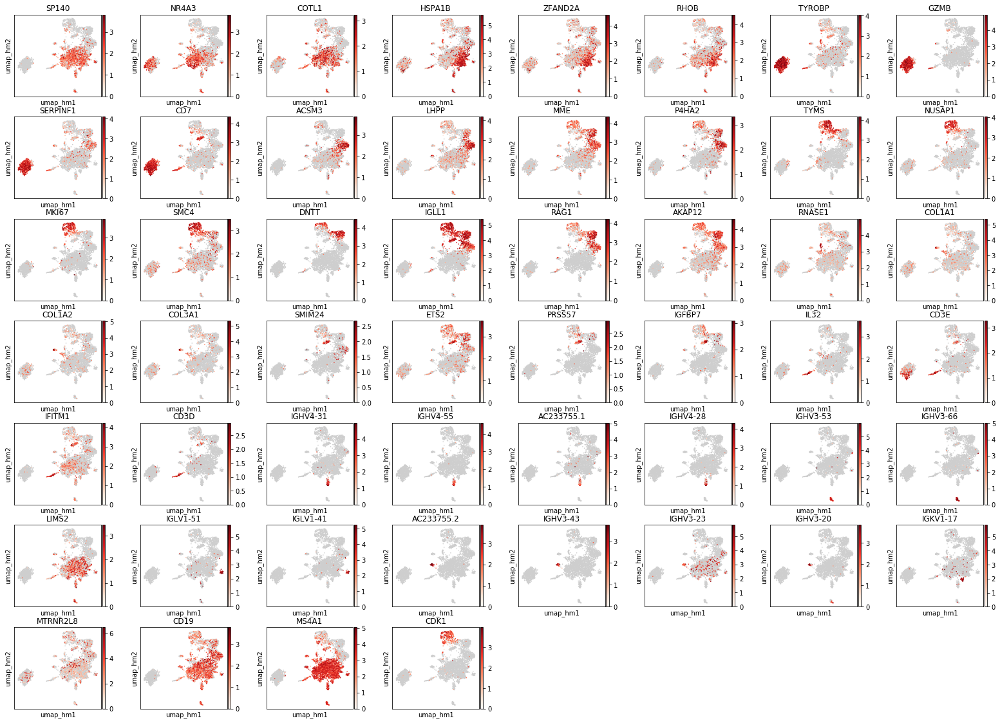

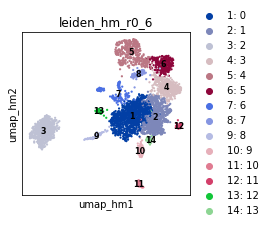

In [11]:
hm_de_genes1 = diffexp(
    ad1, basis='umap', key='hm', res=0.6, method='t-test_overestim_var',
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 1.5},
    extra_genes=['CD19', 'MS4A1', 'CDK1']
)
hm_de_genes1.groupby('cluster').head(5)

In [15]:
hm_de_genes1.groupby('cluster').head(30).to_csv('2.4_B_cells_harmony_withCC_leiden_r0_6_DE_filtered_top30.txt', sep='\t', index=False)

In [16]:
ss.lib.extract_de_table(ad1.uns['rank_genes_groups_hm_r0_6']).groupby('cluster').head(200).to_csv(
    '2.4_B_cells_harmony_withCC_leiden_r0_6_DE_top200.txt', sep='\t', index=False)

,cluster,ref,rank,genes,scores
16324,0,rest,16324,BIRC3,-0.118390
16446,1,rest,0,VPREB1,0.280650
16458,1,rest,12,ARPP21,0.157465
16461,1,rest,15,MME,0.152408
16462,1,rest,16,IGLL1,0.152239
16463,1,rest,17,AKAP12,0.149157
32892,2,rest,0,TYROBP,0.177909
32898,2,rest,6,SERPINF1,0.124340
32899,2,rest,7,FCER1G,0.120199
32902,2,rest,10,GZMB,0.105879


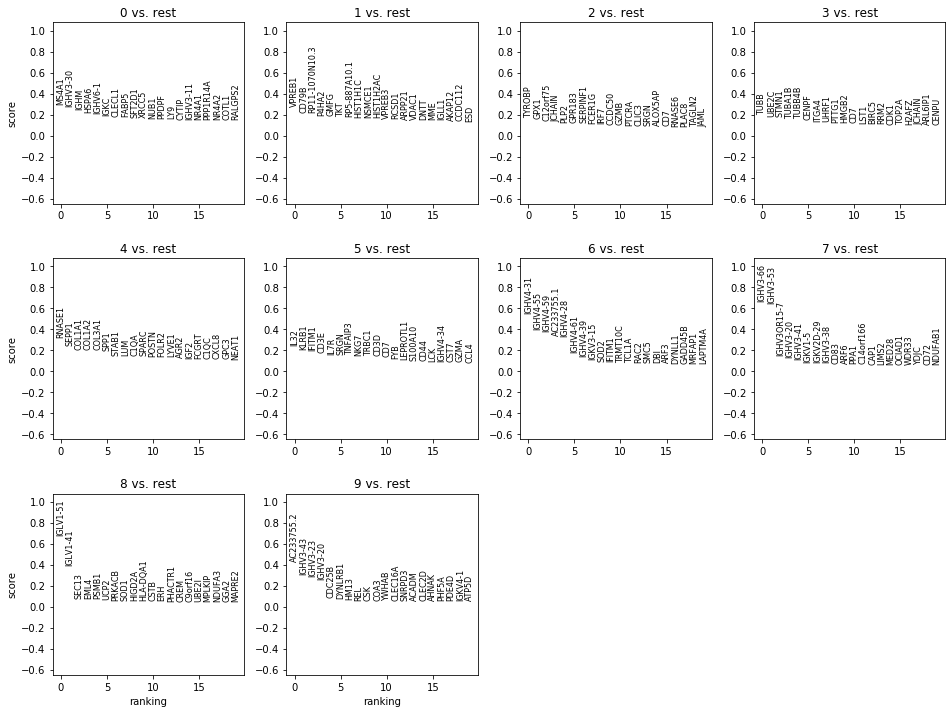

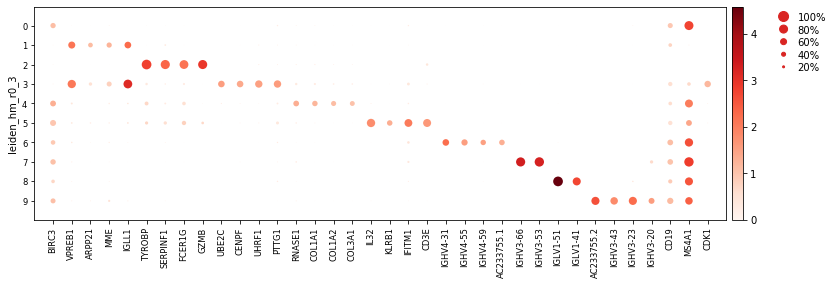

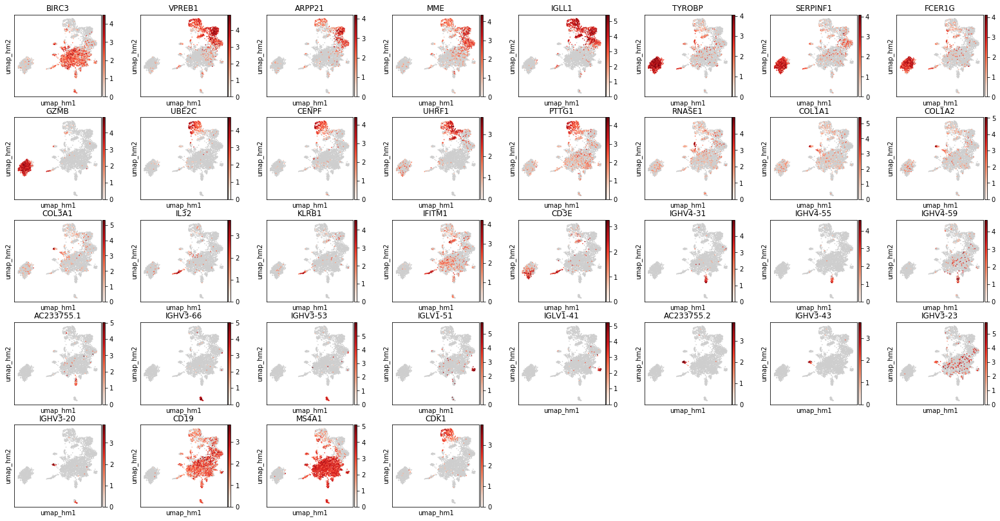

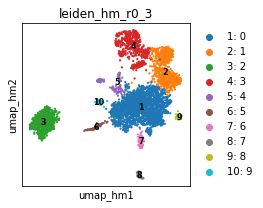

In [119]:
hm_de_genes1 = diffexp(
    ad1, basis='umap', key='hm', res=0.3, method='logreg',
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['CD19', 'MS4A1', 'CDK1']
)
hm_de_genes1.groupby('cluster').head(5)

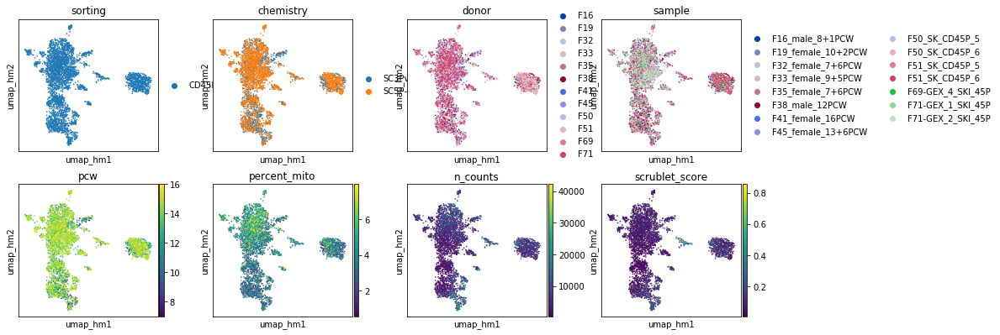

In [74]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad2, basis='umap_hm',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'], size=10)

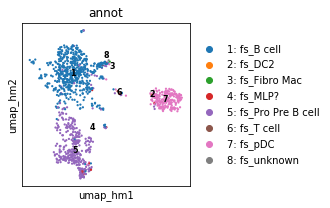

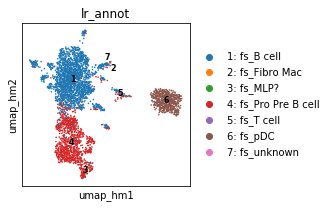

In [93]:
rcParams.update({'figure.figsize':(3,3)})
k_annot = (ad2.obs['annot'] != 'nan').values
ss.lib.plot_embedding(ad2[k_annot, :], basis='umap_hm', groupby='annot', size=20)
ss.lib.plot_embedding(ad2, basis='umap_hm', groupby='lr_annot', size=10)

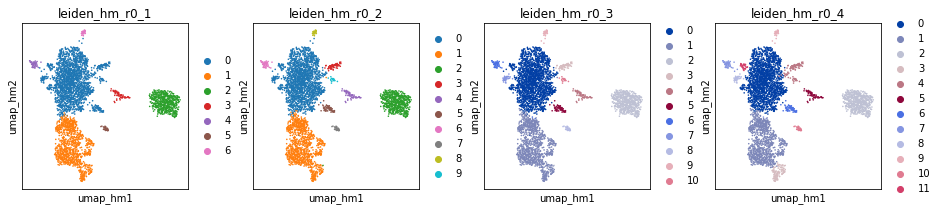

In [75]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad2, basis='umap_hm', color=[f'leiden_hm_r0_{i}' for i in (1,2,3,4)], size=10)

In [137]:
doublet_freq = ad2.obs.groupby('leiden_hm_r0_4')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                    freq         p
leiden_hm_r0_4                    
0               0.001116  0.750000
1               0.003128  0.749144
2               0.015254  0.000045
3               0.073394  0.000000
4               0.009709  0.019077
5               0.142857  0.000000
6               0.000000  0.750000
7               0.000000  0.750000
8               0.000000  0.750000
9               0.000000  0.750000
10              0.060606  0.000000
11              0.000000  0.750000


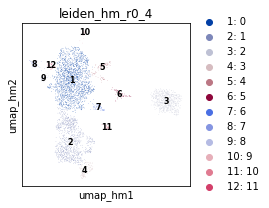

In [139]:
ss.lib.plot_embedding(ad2, basis='umap_hm', groupby='leiden_hm_r0_4', size=1)

,cluster,ref,rank,genes,scores
15443,0,rest,15443,BIRC3,-0.078716
15885,1,rest,0,VPREB1,0.325870
15889,1,rest,4,IGLL1,0.204491
15891,1,rest,6,AKAP12,0.191502
15894,1,rest,9,MME,0.171724
15916,1,rest,31,RAG1,0.124440
31770,2,rest,0,TYROBP,0.143308
31774,2,rest,4,FCER1G,0.133440
31777,2,rest,7,SERPINF1,0.129173
31780,2,rest,10,UGCG,0.112639


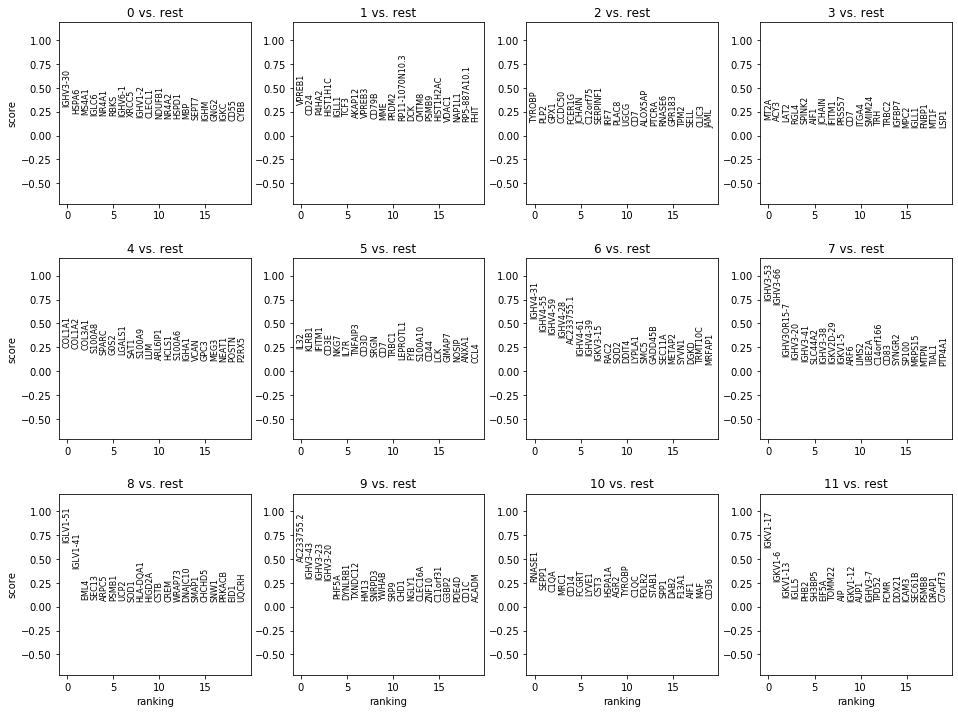

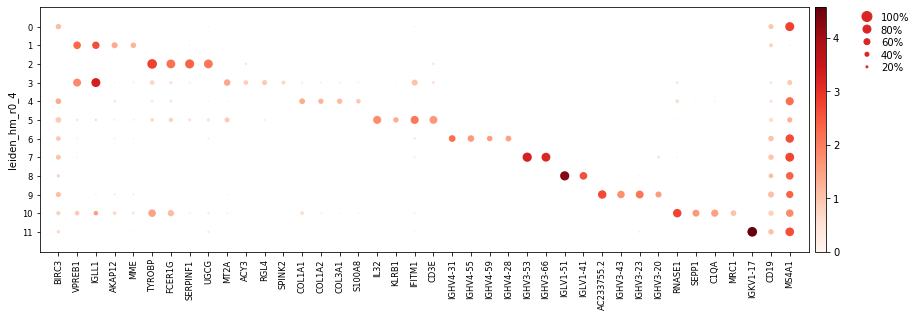

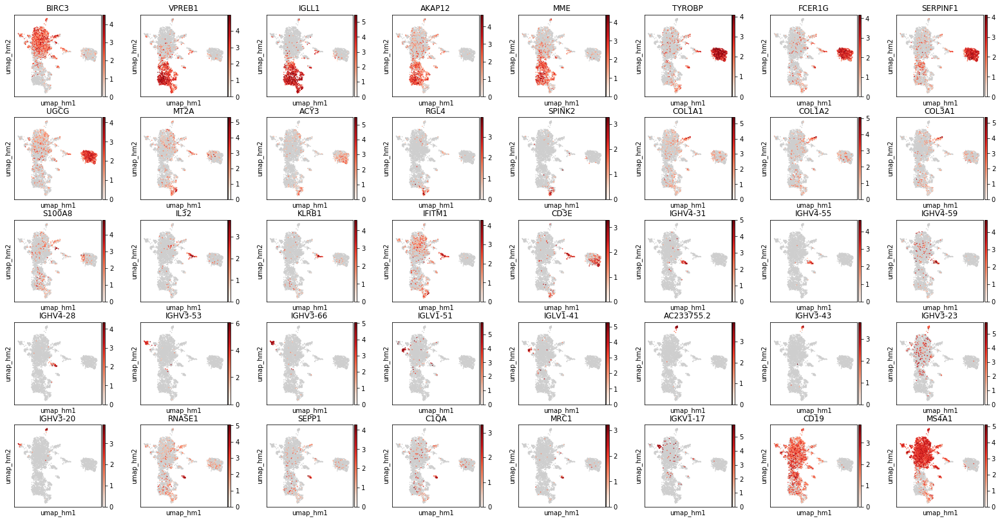

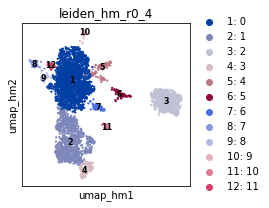

In [118]:
hm_de_genes2 = diffexp(
    ad2, basis='umap', key='hm', res=0.4, method='logreg',
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['CD19', 'MS4A1']
)
hm_de_genes2.groupby('cluster').head(5)

# 4.2 BBKNN

In [78]:
ad1.uns['neighbors'] = ad1.uns['neighbors_orig']
bbknn.bbknn(ad1, batch_key='sample', metric='euclidean', neighbors_within_batch=1, trim=15, copy=False)
ad1.uns['neighbors_bk'] = ad1.uns['neighbors']

In [79]:
ss.lib.umap(ad1, use_graph='neighbors_bk', key_added='bk')

AnnData object with n_obs × n_vars = 3862 × 16446 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', 'leiden_hm_r0_6', 'leiden_hm_r0_7'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_hm', 'neighbors', 'leiden_hm_r0_1_colors', 'leiden_hm_r0_2_colors', 'leiden_hm_r0_3_colors', 'leiden_hm_r0_4_

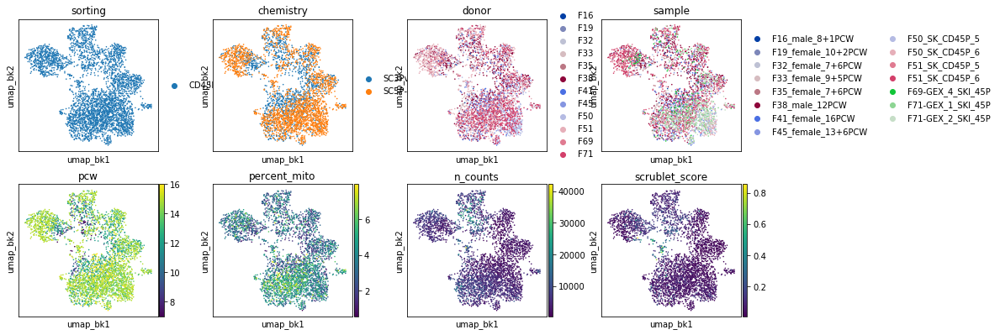

In [80]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_bk',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'],
             size=10)

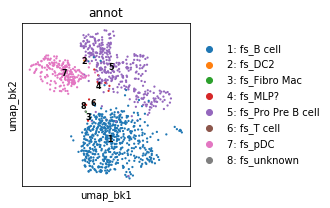

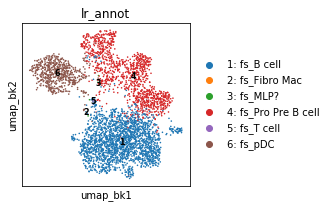

In [92]:
rcParams.update({'figure.figsize':(3,3)})
k_annot = (ad1.obs['annot'] != 'nan').values
ss.lib.plot_embedding(ad1[k_annot, :], basis='umap_bk', groupby='annot', size=20)
ss.lib.plot_embedding(ad1, basis='umap_bk', groupby='lr_annot', size=10)

In [81]:
ss.lib.leiden(ad1, use_graph='neighbors_bk', key_added='bk', resolution=[0.1, 0.2, 0.3, 0.4, 0.5,])

AnnData object with n_obs × n_vars = 3862 × 16446 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', 'leiden_hm_r0_6', 'leiden_hm_r0_7', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_hm', 'neighbors', '

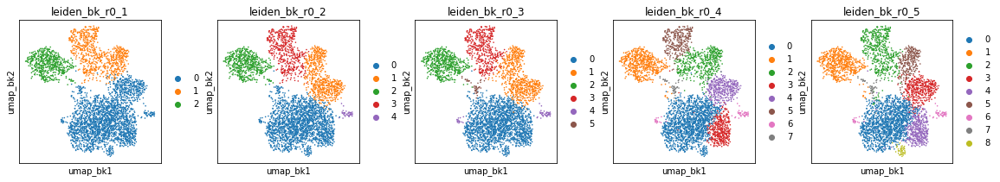

In [82]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad1, basis='umap_bk', color=[f'leiden_bk_r{str(res).replace(".", "_")}' for res in (0.1, 0.2, 0.3, 0.4, 0.5,)], size=10, ncols=5)

In [83]:
doublet_freq = ad1.obs.groupby('leiden_bk_r0_3')['doublet'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                    freq         p
leiden_bk_r0_3                    
0               0.002513  0.768661
1               0.005666  0.682607
2               0.017212  0.317393
3               0.018908  0.269430
4               0.000000  0.826693
5               0.133333  0.000000


In [84]:
doublet_freq = ad1.obs.groupby('leiden_bk_r0_3')['scrublet_score'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

                   score             p
leiden_bk_r0_3                        
0               0.055641  6.381514e-01
1               0.036443  7.763624e-01
2               0.089037  3.618486e-01
3               0.117275  1.707124e-01
4               0.044518  7.220748e-01
5               0.350380  1.971875e-09


,cluster,ref,rank,genes,scores
0,0,rest,0,MS4A1,0.425407
51,0,rest,51,FCRLA,0.099623
61,0,rest,61,NR4A2,0.095850
840,0,rest,840,BIRC3,0.040287
15558,0,rest,15558,SLC2A3,-0.042524
16446,1,rest,0,VPREB1,0.245060
16449,1,rest,3,MME,0.204903
16450,1,rest,4,IGLL1,0.191145
16455,1,rest,9,AKAP12,0.160836
16481,1,rest,35,ARPP21,0.108444


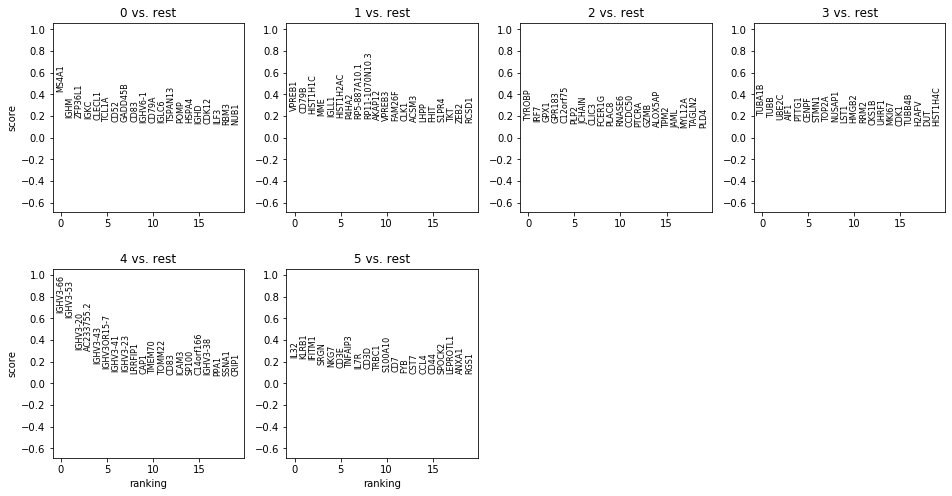

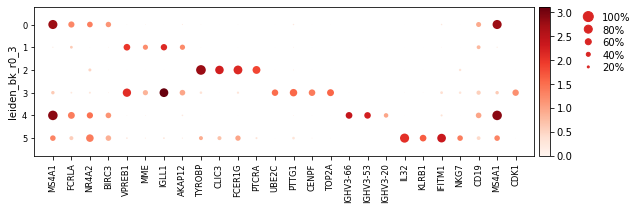

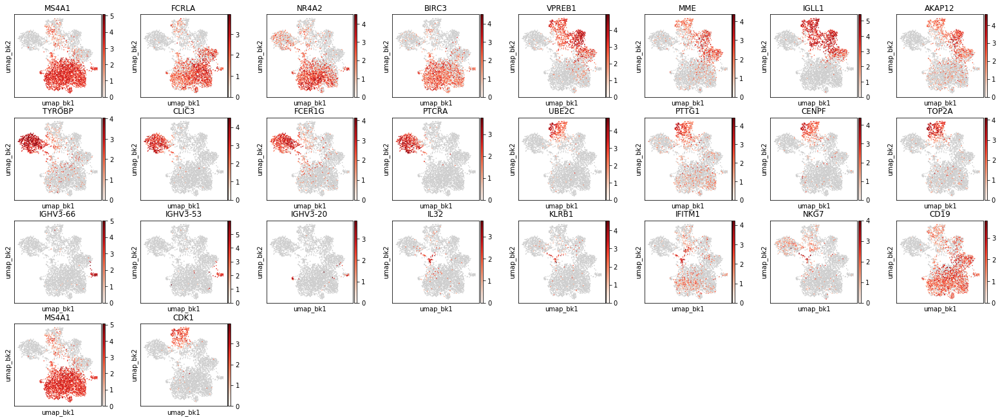

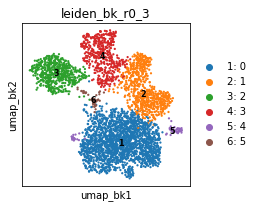

In [115]:
bk_de_genes1 = diffexp(
    ad1, basis='umap', key='bk', res=0.3, method='logreg',
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['CD19', 'MS4A1', 'CDK1']
)
bk_de_genes1.groupby('cluster').head(5)

In [85]:
ad2.uns['neighbors'] = ad2.uns['neighbors_orig']
bbknn.bbknn(ad2, batch_key='sample', metric='euclidean', neighbors_within_batch=1, trim=15, copy=False)
ad2.uns['neighbors_bk'] = ad2.uns['neighbors']

In [86]:
ss.lib.umap(ad2, use_graph='neighbors_bk', key_added='bk')

AnnData object with n_obs × n_vars = 3862 × 15885 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_hm', 'neighbors', 'leiden_hm_r0_1_colors', 'leiden_hm_r0_2_colors', 'leiden_hm_r0_3_colors', 'leiden_hm_r0_4_colors', 'neighbors_bk'
    obsm: 'X_pca', 'X_umap_ori

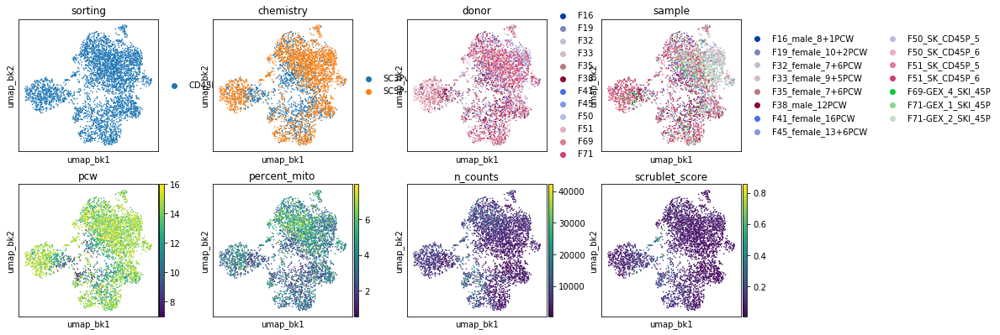

In [87]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(ad2, basis='umap_bk',
             color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'],
             size=10)

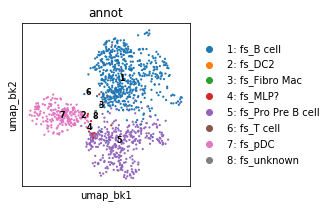

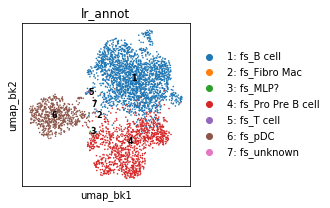

In [113]:
rcParams.update({'figure.figsize':(3,3)})
k_annot = (ad2.obs['annot'] != 'nan').values
ss.lib.plot_embedding(ad2[k_annot, :], basis='umap_bk', groupby='annot', size=20)
ss.lib.plot_embedding(ad2, basis='umap_bk', groupby='lr_annot', size=10)

In [88]:
ss.lib.leiden(ad2, use_graph='neighbors_bk', key_added='bk', resolution=[0.1, 0.2, 0.3, 0.4, 0.5,])

AnnData object with n_obs × n_vars = 3862 × 15885 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_hm', 'neighbors', 'leiden_hm_r0_1_colors', 'leiden_hm_r0_2_colors', 'leid

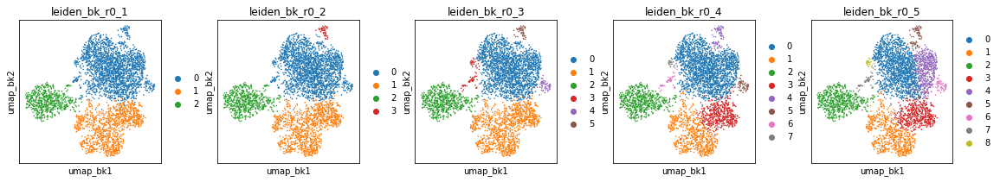

In [89]:
rcParams.update({'figure.figsize':(3,3)})
plot_scatter(
    ad2, basis='umap_bk',
    color=[f'leiden_bk_r{str(res).replace(".", "_")}' for res in (0.1, 0.2, 0.3, 0.4, 0.5,)], size=10, ncols=5)

In [111]:
doublet_freq = ad2.obs.groupby('leiden_bk_r0_3')['doublet'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

                    freq         p
leiden_bk_r0_3                    
0               0.002046  0.695802
1               0.014978  0.304198
2               0.018092  0.223888
3               0.031250  0.035792
4               0.000000  0.750000
5               0.000000  0.750000


In [112]:
doublet_freq = ad2.obs.groupby('leiden_bk_r0_3')['scrublet_score'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

                   score             p
leiden_bk_r0_3                        
0               0.055668  5.824893e-01
1               0.068397  4.175107e-01
2               0.092827  1.567954e-01
3               0.243404  1.468044e-09
4               0.041775  7.463021e-01
5               0.041066  7.536698e-01


,cluster,ref,rank,genes,scores
0,0,rest,0,MS4A1,0.336092
16,0,rest,16,FCRLA,0.140065
2761,0,rest,2761,BIRC3,0.016527
15040,0,rest,15040,SLC2A3,-0.047997
15885,1,rest,0,IGLL1,0.366069
15886,1,rest,1,VPREB1,0.330010
15887,1,rest,2,MME,0.222593
15897,1,rest,12,RAG1,0.134920
15902,1,rest,17,AKAP12,0.124376
31770,2,rest,0,TYROBP,0.178083


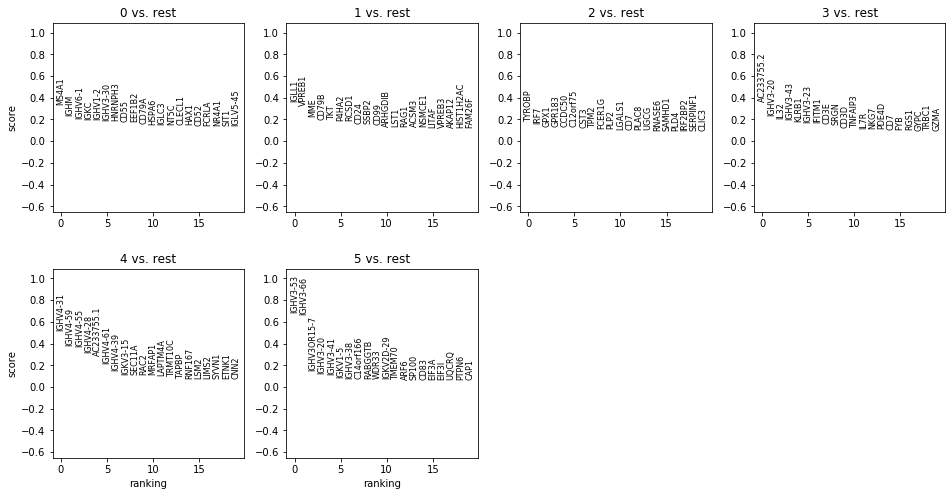

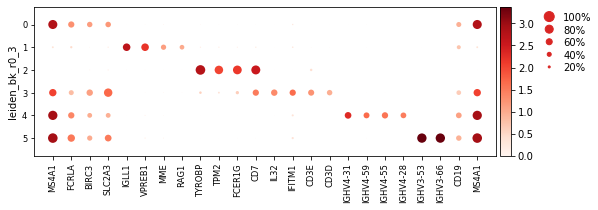

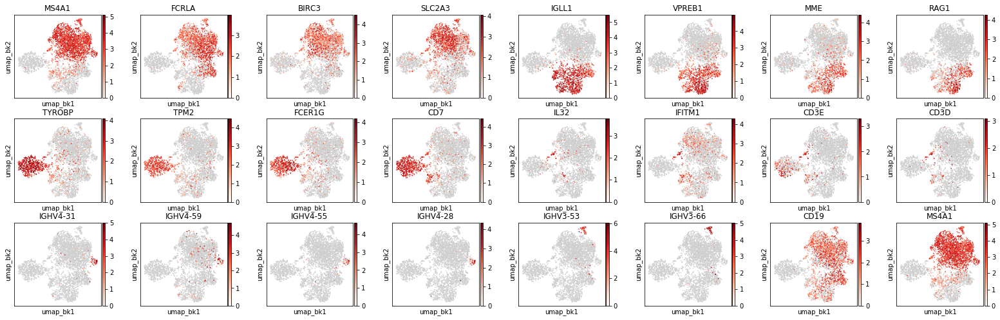

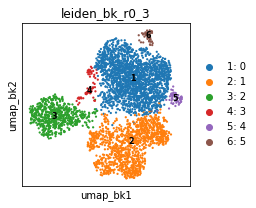

In [114]:
bk_de_genes2 = diffexp(
    ad2, basis='umap', key='bk', res=0.3, method='logreg',
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['CD19', 'MS4A1']
)
bk_de_genes2.groupby('cluster').head(5)

,cluster,ref,rank,genes,scores,logfoldchanges,pvals,pvals_adj
11,0,rest,11,GZMB,59.070953,4.020739,0.000000e+00,0.000000e+00
19,0,rest,19,GNLY,55.804749,4.467519,0.000000e+00,0.000000e+00
22,0,rest,22,KLRD1,54.666611,3.162036,0.000000e+00,0.000000e+00
27,0,rest,27,AOAH,48.295742,2.907533,0.000000e+00,0.000000e+00
28,0,rest,28,SH2D1B,48.158974,3.627403,0.000000e+00,0.000000e+00
20032,1,rest,27,ICOS,38.170612,2.362924,0.000000e+00,0.000000e+00
40023,2,rest,13,C1orf56,36.790733,3.666779,2.597169e-296,1.574436e-293
40025,2,rest,15,NDUFB8,36.107944,2.571943,1.702000e-285,9.457922e-283
40028,2,rest,18,SPP1,34.805038,2.828971,2.040876e-265,1.046865e-262
40029,2,rest,19,PSMA2,34.785423,2.744241,4.040400e-265,2.020705e-262


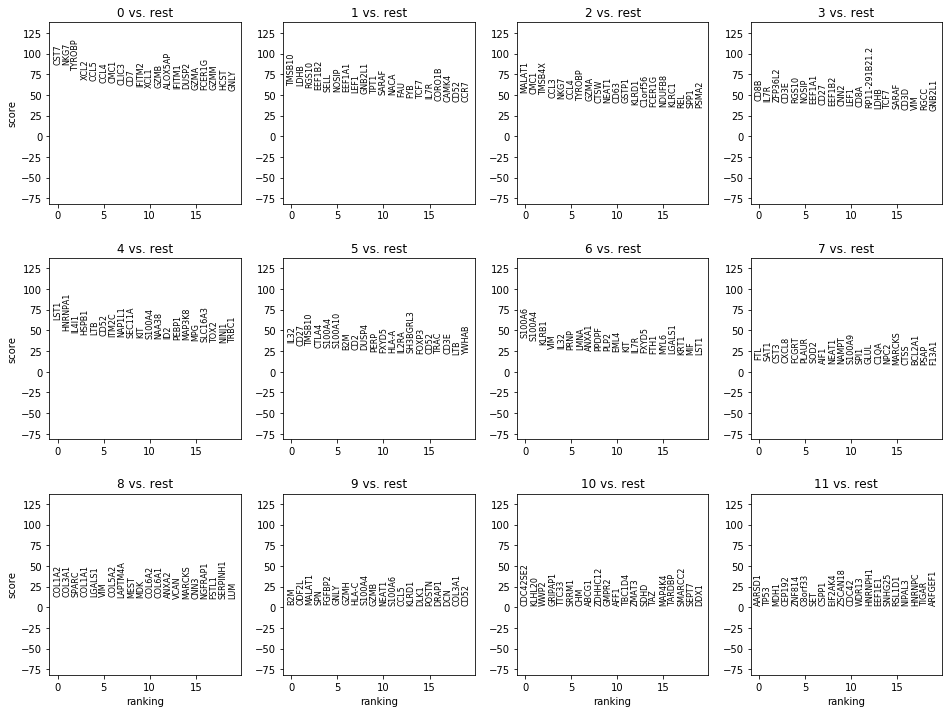

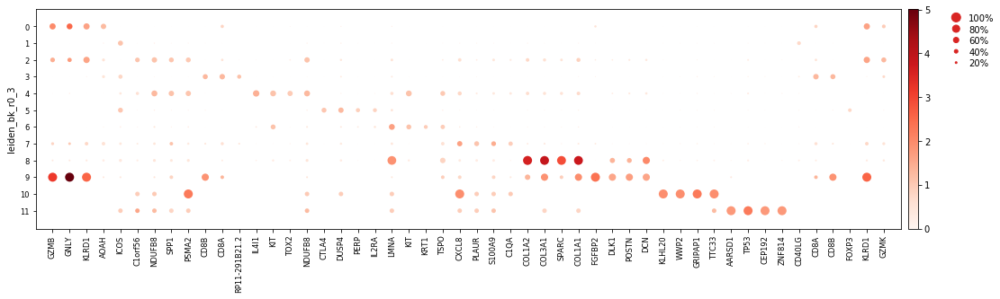

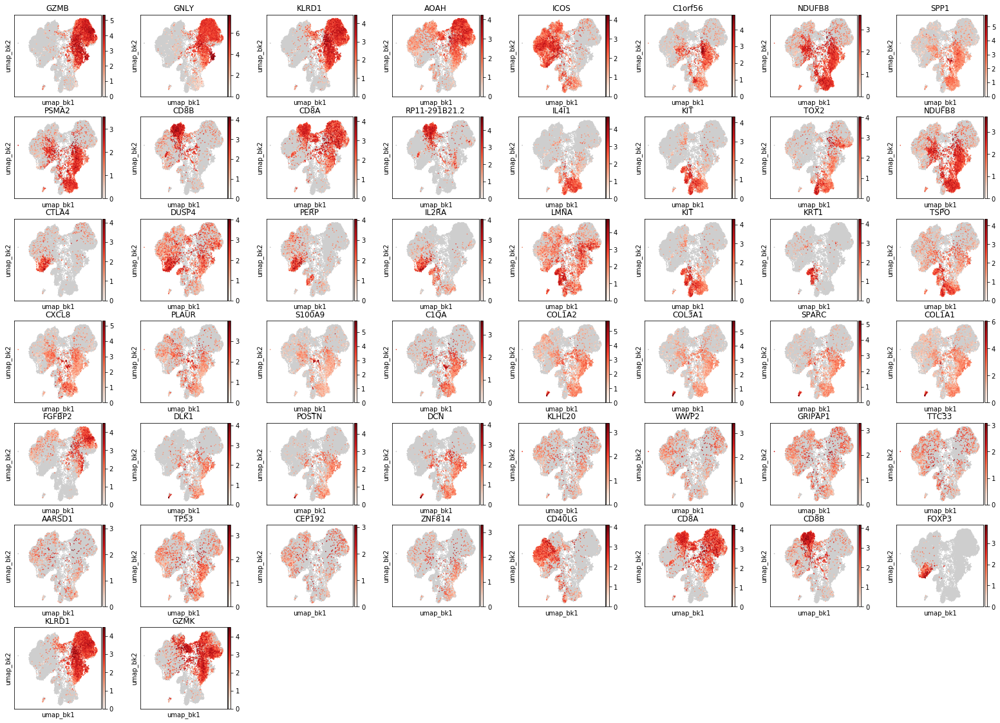

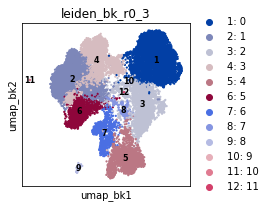

In [146]:
bk_de_genes2 = diffexp(
    ad2, basis='umap', key='bk', res=0.3, method='wilcoxon',
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=['CD40LG', 'CD8A', 'CD8B', 'FOXP3', 'KLRD1', 'GZMK']
)
bk_de_genes2.groupby('cluster').head(5)

# 5. Compare clustering

In [95]:
adt = ad1.copy()
adt.obs['leiden_orig_nocc_r0_4'] = ad2.obs['leiden_orig_r0_4']
adt.obs['leiden_hm_nocc_r0_2'] = ad2.obs['leiden_hm_r0_2']
adt.obs['leiden_bk_nocc_r0_3'] = ad2.obs['leiden_bk_r0_3']

In [96]:
adt.obsm['X_umap_nocc_orig'] = ad2.obsm['X_umap_orig']
adt.obsm['X_umap_nocc_hm'] = ad2.obsm['X_umap_hm']
adt.obsm['X_umap_nocc_bk'] = ad2.obsm['X_umap_bk']

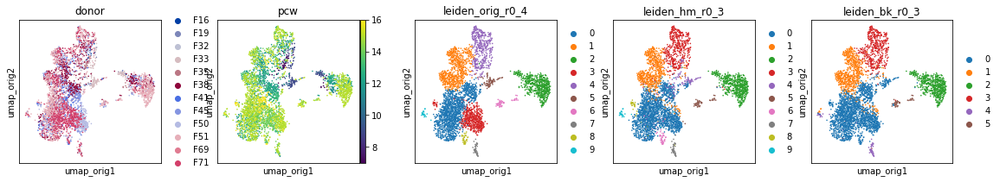

In [97]:
plot_scatter(
    adt, basis='umap_orig',
    color=['donor', 'pcw', 'leiden_orig_r0_4', 'leiden_hm_r0_3', 'leiden_bk_r0_3'], ncols=5, size=10)

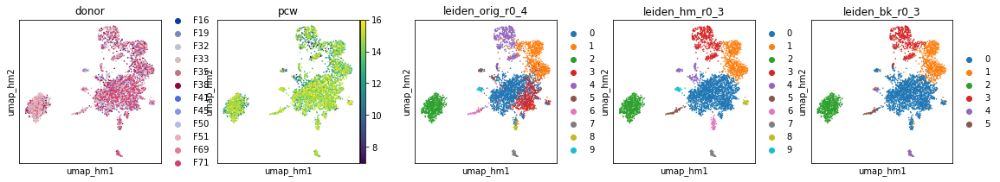

In [98]:
plot_scatter(
    adt, basis='umap_hm',
    color=['donor', 'pcw', 'leiden_orig_r0_4', 'leiden_hm_r0_3', 'leiden_bk_r0_3'], ncols=5, size=10)

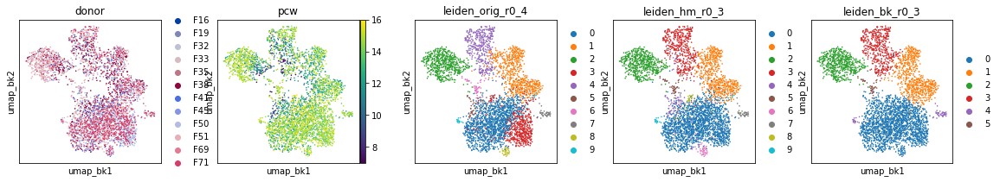

In [100]:
plot_scatter(
    adt, basis='umap_bk',
    color=['donor', 'pcw', 'leiden_orig_r0_4', 'leiden_hm_r0_3', 'leiden_bk_r0_3'], ncols=5, size=10)

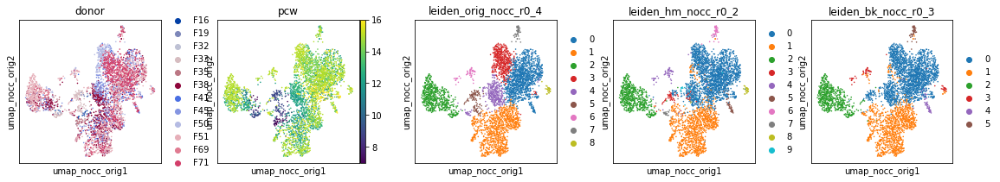

In [101]:
plot_scatter(
    adt, basis='umap_nocc_orig',
    color=['donor', 'pcw', 'leiden_orig_nocc_r0_4', 'leiden_hm_nocc_r0_2', 'leiden_bk_nocc_r0_3'], ncols=5, size=10)

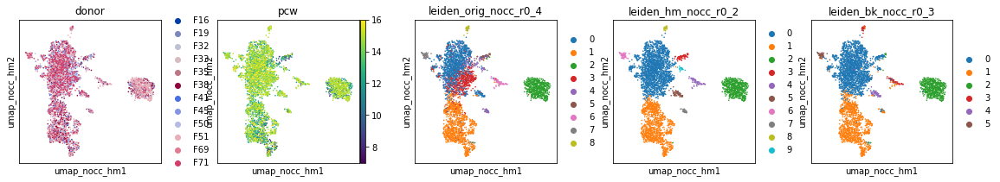

In [102]:
plot_scatter(
    adt, basis='umap_nocc_hm',
    color=['donor', 'pcw', 'leiden_orig_nocc_r0_4', 'leiden_hm_nocc_r0_2', 'leiden_bk_nocc_r0_3'], ncols=5, size=10)

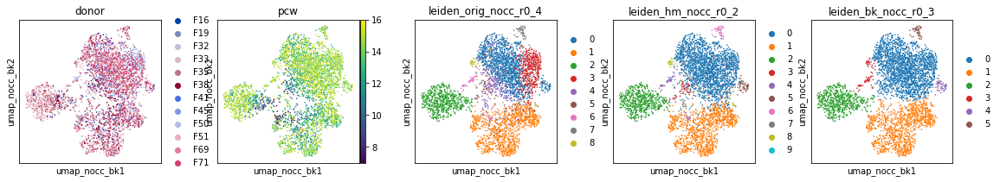

In [103]:
plot_scatter(
    adt, basis='umap_nocc_bk',
    color=['donor', 'pcw', 'leiden_orig_nocc_r0_4', 'leiden_hm_nocc_r0_2', 'leiden_bk_nocc_r0_3'], ncols=5, size=10)

In [104]:
ss.lib.cross_table(adt, 'leiden_orig_nocc_r0_4', 'leiden_orig_r0_4', highlight=True)

leiden_orig_r0_4,0,1,2,3,4,5,6,7,8,9
leiden_orig_nocc_r0_4,,,,,,,,,,
0,1100,8,0,61,15,0,0,0,35,0
1,17,655,1,2,324,1,0,0,0,0
2,0,0,581,0,17,0,0,0,0,0
3,19,4,0,459,1,0,0,0,0,0
4,271,13,0,15,29,2,0,0,0,0
5,1,2,1,0,29,72,0,0,0,0
6,0,3,0,0,0,0,48,0,0,0
7,1,2,0,0,1,0,0,45,0,0
8,0,0,0,0,1,0,0,0,0,26


In [105]:
ss.lib.cross_table(adt, 'leiden_hm_nocc_r0_2', 'leiden_hm_r0_3', highlight=True)

leiden_hm_r0_3,0,1,2,3,4,5,6,7,8,9
leiden_hm_nocc_r0_2,,,,,,,,,,
0,1788,24,0,24,21,2,6,0,36,4
1,14,623,0,408,3,0,0,0,0,0
2,0,0,575,16,0,0,0,0,0,0
3,6,0,2,1,56,0,0,0,0,0
4,0,0,0,5,0,58,0,0,0,0
5,3,1,0,1,0,0,53,0,0,0
6,2,0,0,1,0,0,0,46,0,0
7,1,0,0,4,28,0,0,0,0,0
8,2,0,0,0,0,0,0,0,0,28


In [106]:
ss.lib.cross_table(adt, 'leiden_bk_nocc_r0_3', 'leiden_bk_r0_3', highlight=True)

leiden_bk_r0_3,0,1,2,3,4,5
leiden_bk_nocc_r0_3,,,,,,
0,1897,32,0,24,1,1
1,26,673,0,431,0,5
2,7,0,581,19,0,1
3,5,0,0,2,19,38
4,53,1,0,0,0,0
5,2,0,0,0,44,0


In [107]:
ss.lib.cross_table(adt, 'leiden_bk_r0_3', 'leiden_orig_r0_4', highlight=True)

leiden_orig_r0_4,0,1,2,3,4,5,6,7,8,9
leiden_bk_r0_3,,,,,,,,,,
0,1361,8,2,503,7,67,3,1,35,3
1,42,608,0,33,8,8,0,1,0,6
2,0,0,580,0,1,0,0,0,0,0
3,3,71,1,0,400,0,1,0,0,0
4,3,0,0,1,0,0,0,43,0,17
5,0,0,0,0,1,0,44,0,0,0


In [108]:
ss.lib.cross_table(adt, 'leiden_bk_r0_3', 'leiden_hm_r0_3', highlight=True)

leiden_hm_r0_3,0,1,2,3,4,5,6,7,8,9
leiden_bk_r0_3,,,,,,,,,,
0,1775,11,2,5,91,9,54,3,33,7
1,53,617,0,16,5,1,5,1,2,6
2,1,0,576,2,0,2,0,0,0,0
3,3,21,0,437,12,3,0,0,0,0
4,2,0,0,0,0,0,0,42,1,19
5,0,0,0,0,0,45,0,0,0,0


In [109]:
ss.lib.cross_table(adt, 'leiden_bk_nocc_r0_3', 'leiden_hm_nocc_r0_2', highlight=True)

leiden_hm_nocc_r0_2,0,1,2,3,4,5,6,7,8,9
leiden_bk_nocc_r0_3,,,,,,,,,,
0,1838,13,2,57,5,5,3,11,4,17
1,55,1031,0,1,12,5,2,20,7,2
2,2,4,589,7,3,0,0,2,0,1
3,2,0,0,0,43,0,0,0,19,0
4,6,0,0,0,0,48,0,0,0,0
5,2,0,0,0,0,0,44,0,0,0


In [110]:
ss.lib.cross_table(adt, 'leiden_bk_nocc_r0_3', 'leiden_orig_nocc_r0_4', highlight=True)

leiden_orig_nocc_r0_4,0,1,2,3,4,5,6,7,8
leiden_bk_nocc_r0_3,,,,,,,,,
0,1146,4,1,446,293,63,1,0,1
1,17,994,0,34,34,36,9,4,7
2,0,2,597,0,3,6,0,0,0
3,3,0,0,1,0,0,41,0,19
4,52,0,0,2,0,0,0,0,0
5,1,0,0,0,0,0,0,45,0


In [18]:
ad1.write('data/h5ad/fetal_skin_hierarch1_B-cells_processed.h5ad', compression='gzip')
ad2.write('data/h5ad/fetal_skin_hierarch1_B-cells_processed_nocc.h5ad', compression='gzip')

In [7]:
ad1 = sc.read('data/h5ad/fetal_skin_hierarch1_B-cells_processed.h5ad')
ad2 = sc.read('data/h5ad/fetal_skin_hierarch1_B-cells_processed_nocc.h5ad')

In [8]:
ad1.obsm['X_umap_hm_nocc'] = ad2.obsm['X_umap_hm']
for r in (1,2,3,4):
    ad1.obs[f'leiden_hm_nocc_r0_{r}'] = ad2.obs[f'leiden_hm_r0_{r}']

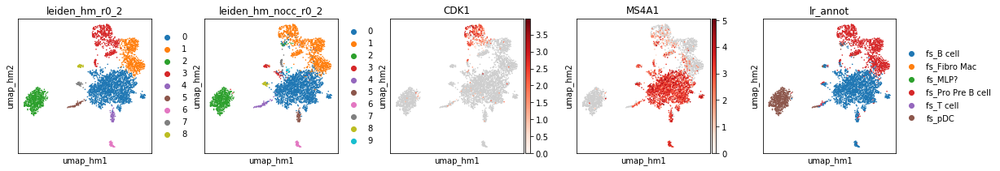

In [25]:
ss.lib.set_figsize((3,3))
plot_scatter(ad1, basis='umap_hm', color=['leiden_hm_r0_2', 'leiden_hm_nocc_r0_2', 'CDK1', 'MS4A1', 'lr_annot'], ncols=5, size=10, color_map=expr_cmap)

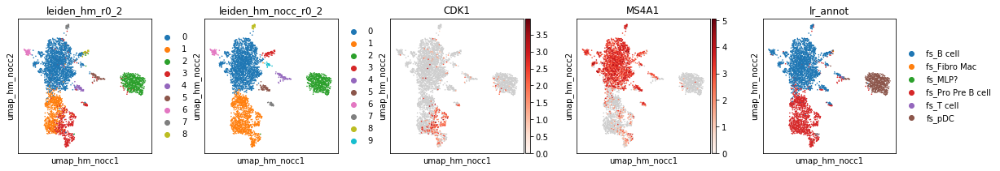

In [26]:
ss.lib.set_figsize((3,3))
plot_scatter(ad1, basis='umap_hm_nocc', color=['leiden_hm_r0_2', 'leiden_hm_nocc_r0_2', 'CDK1', 'MS4A1', 'lr_annot'], ncols=5, size=10, color_map=expr_cmap)

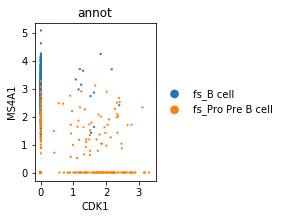

In [32]:
sc.pl.scatter(ad1[ad1.obs['annot'].isin(['fs_B cell', 'fs_Pro Pre B cell']), :], x='CDK1', y='MS4A1', color='annot', size=20)

# 6. Trajectory

In [129]:
ad3 = ad1[~ad1.obs['leiden_hm_r0_3'].isin(['2', '4', '5',]), :]

In [130]:
ss.lib.paga(ad3, use_graph='neighbors_hm', key_added='hm', groups='leiden_hm_r0_3')

AnnData object with n_obs × n_vars = 3116 × 16446 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', 'leiden_hm_r0_6', 'leiden_hm_r0_7', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', '__is_in_cluster__'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbor

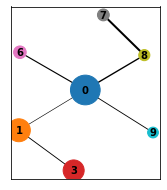

In [131]:
ss.lib.plot_paga(ad3, use_key='paga_hm', solid_edges='connectivities_tree', edge_width_scale=1, color='pcw', size=20)

In [132]:
ss.lib.diffmap(ad3, use_graph='neighbors_hm', key_added='hm')

AnnData object with n_obs × n_vars = 3116 × 16446 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', 'leiden_hm_r0_6', 'leiden_hm_r0_7', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', '__is_in_cluster__'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbor

In [133]:
ss.lib.dpt(ad3, use_graph='neighbors_hm', use_diffmap='X_diffmap_hm', key_added='hm', root=['leiden_hm_r0_3', '3'])

AnnData object with n_obs × n_vars = 3116 × 16446 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', 'leiden_hm_r0_6', 'leiden_hm_r0_7', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', '__is_in_cluster__', 'dpt_pseudotime_hm'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0

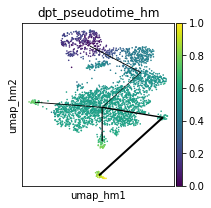

In [134]:
ss.lib.plot_paga(ad3, use_key='paga_hm', basis='umap_hm', solid_edges='connectivities_tree', edge_width_scale=1, color='dpt_pseudotime_hm', size=10)

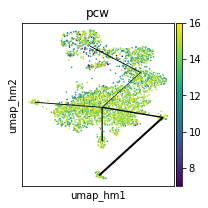

In [135]:
ss.lib.plot_paga(ad3, use_key='paga_hm', basis='umap_hm', solid_edges='connectivities_tree', edge_width_scale=1, color='pcw', size=10)

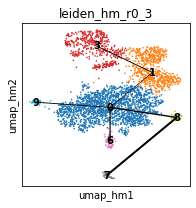

In [136]:
ss.lib.plot_paga(ad3, use_key='paga_hm', basis='umap_hm', solid_edges='connectivities_tree', edge_width_scale=1, color='leiden_hm_r0_3', size=10)

In [153]:
ad4 = ad2[~ad2.obs['leiden_hm_r0_4'].isin(['2', '4', '5', '10']), :]

In [154]:
ss.lib.paga(ad4, use_graph='neighbors_hm', key_added='hm', groups='leiden_hm_r0_4')

AnnData object with n_obs × n_vars = 3073 × 15885 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', '__is_in_cluster__'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_hm', 'neighbors', 'leiden_hm_r0_1_colors', 'leiden_h

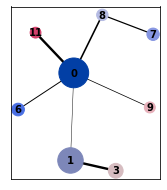

In [155]:
ss.lib.plot_paga(ad4, use_key='paga_hm', solid_edges='connectivities_tree', edge_width_scale=1, color='pcw', size=20)

In [156]:
ss.lib.diffmap(ad4, use_graph='neighbors_hm', key_added='hm')

AnnData object with n_obs × n_vars = 3073 × 15885 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', '__is_in_cluster__'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_hm', 'neighbors', 'leiden_hm_r0_1_colors', 'leiden_h

In [157]:
ss.lib.dpt(ad4, use_graph='neighbors_hm', use_diffmap='X_diffmap_hm', key_added='hm', root=['leiden_hm_r0_4', '3'])

AnnData object with n_obs × n_vars = 3073 × 15885 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', '__is_in_cluster__', 'dpt_pseudotime_hm'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'neighbors_hm', 'neighbors', 'leiden_hm_r0

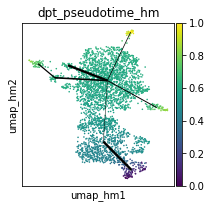

In [158]:
ss.lib.plot_paga(ad4, use_key='paga_hm', basis='umap_hm', solid_edges='connectivities_tree', edge_width_scale=1, color='dpt_pseudotime_hm', size=10)

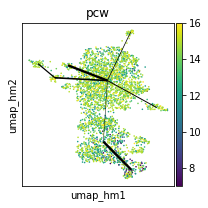

In [159]:
ss.lib.plot_paga(ad4, use_key='paga_hm', basis='umap_hm', solid_edges='connectivities_tree', edge_width_scale=1, color='pcw', size=10)

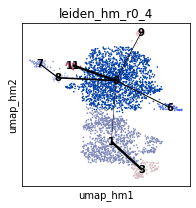

In [160]:
ss.lib.plot_paga(ad4, use_key='paga_hm', basis='umap_hm', solid_edges='connectivities_tree', edge_width_scale=1, color='leiden_hm_r0_4', size=10)

# 6. Incorporate annotation

In [7]:
ad1 = sc.read(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}_processed.h5ad')
ad2 = sc.read(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}_processed_nocc.h5ad')
ad1.uns['neighbors_hm_nocc'] = ad2.uns['neighbors_hm']
ad1.uns['neighbors_bk_nocc'] = ad2.uns['neighbors_bk']
ad1.obsm['X_umap_hm_nocc'] = ad2.obsm['X_umap_hm']
ad1.obsm['X_umap_bk_nocc'] = ad2.obsm['X_umap_bk']

In [9]:
ss.lib.leiden(ad1, use_graph='neighbors_hm', key_added='hm', resolution=CLUSTER_RESOLUTIONS)
ss.lib.leiden(ad1, use_graph='neighbors_hm_nocc', key_added='hm_nocc', resolution=CLUSTER_RESOLUTIONS)
ss.lib.leiden(ad1, use_graph='neighbors_bk', key_added='bk', resolution=CLUSTER_RESOLUTIONS)
ss.lib.leiden(ad1, use_graph='neighbors_bk_nocc', key_added='bk_nocc', resolution=CLUSTER_RESOLUTIONS)

['leiden_bk_nocc_r0_1',
 'leiden_bk_nocc_r0_2',
 'leiden_bk_nocc_r0_3',
 'leiden_bk_nocc_r0_4',
 'leiden_bk_nocc_r0_5']

In [19]:
ad1.obs['rachel_annot1'] = ad1.obs['leiden_hm_r0_6'].cat.rename_categories({
    '0': 'B 2',
    '1': 'B 1',
    '2': 'pDC',
    '3': 'Pre B',
    '4': 'Proliferating pre-pro/pro/pre',
    '5': 'Pro B',
    '6': 'Doublets (Macro/Fibro)',
    '7': 'Pre-pro B',
    '8': 'Doublets (T)',
    '9': 'IGHV4 B',
    '10': 'IGHV3-53 B',
    '11': 'IGLV1 B',
    '12': 'IGHV3-23 B',
    '13': 'IGKV1 B'
})

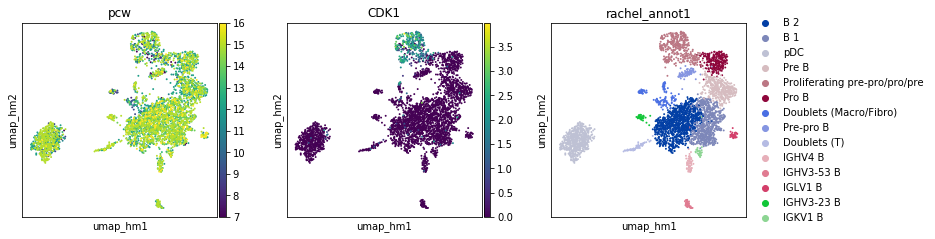

In [20]:
ss.lib.set_figsize((3.5, 3.5))
plot_scatter(ad1, basis='umap_hm', color=['pcw', 'CDK1', 'rachel_annot1'], size=15)

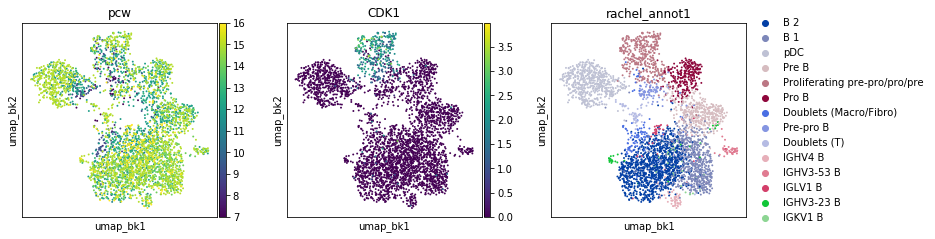

In [21]:
plot_scatter(ad1, basis='umap_bk', color=['pcw', 'CDK1', 'rachel_annot1'], size=15)

In [22]:
ss.lib.cross_table(ad1, 'annot', 'rachel_annot1', highlight=True)

rachel_annot1,B 2,B 1,pDC,Pre B,Proliferating pre-pro/pro/pre,Pro B,Doublets (Macro/Fibro),Pre-pro B,Doublets (T),IGHV4 B,IGHV3-53 B,IGLV1 B,IGHV3-23 B,IGKV1 B
annot,,,,,,,,,,,,,,
fs_B cell,377,102,1,4,3,0,60,3,5,14,7,9,5,6
fs_DC2,0,0,0,0,1,0,0,0,0,0,0,0,0,0
fs_Fibro Mac,0,0,0,0,0,0,1,0,0,0,0,0,0,0
fs_MLP?,0,1,1,0,1,0,3,6,1,0,0,0,0,0
fs_Pro Pre B cell,3,5,1,77,177,55,8,36,1,2,0,0,1,0
fs_T cell,0,0,0,0,0,0,0,0,2,0,0,0,0,0
fs_pDC,0,1,213,0,7,0,1,0,2,0,0,0,0,0
fs_unknown,0,0,0,0,0,0,1,0,0,0,0,0,0,0
nan,718,568,362,316,189,201,54,38,49,43,40,27,27,26


# 7. Over-cluster to remove doublet

In [23]:
ad1

AnnData object with n_obs × n_vars = 3862 × 16446 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', 'leiden_hm_r0_6', 'leiden_hm_r0_7', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', '__is_in_cluster__', 'leiden_hm_nocc_r0_1', 'leiden_hm_nocc_r0_2', 'leiden_hm_nocc_r0_3', 'leiden_hm_nocc_r0_4', 'leiden_bk_nocc_r0_1', 'leiden_bk_nocc_r0_2', 'leiden_bk_nocc_r0_3', 'leiden_bk_nocc_r0_4', 'leiden_hm_nocc_r0_5', 'leiden_bk_nocc_r0_5', 'rachel_annot1'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'hi

In [24]:
ss.lib.leiden(ad1, use_graph='neighbors_hm', resolution=[3.0], key_added='hm')

['leiden_hm_r3_0']

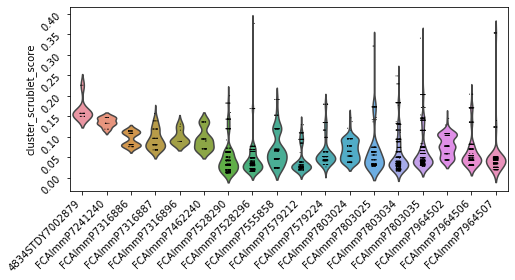

In [25]:
ss.lib.set_figsize((7, 3.5))
sc.pl.violin(ad1, keys='cluster_scrublet_score', groupby='sanger_id', rotation=45)

In [26]:
ad1.obs['scrublet_z'] = ad1.obs.groupby('sanger_id')['scrublet_score'].apply(lambda x: ss.lib.test_outlier(x, robust=True, upper_mad_only=True)[0])
ad1.obs['cluster_scrublet_z'] = ad1.obs.groupby('sanger_id')['cluster_scrublet_score'].apply(lambda x: ss.lib.test_outlier(x, robust=True, upper_mad_only=True)[0])

In [27]:
ad1.obs['cluster_scrublet_z'].describe()

count    3862.000000
mean        0.380170
std         1.932352
min        -2.780833
25%        -0.218435
50%         0.000000
75%         0.674491
max        36.748815
Name: cluster_scrublet_z, dtype: float64

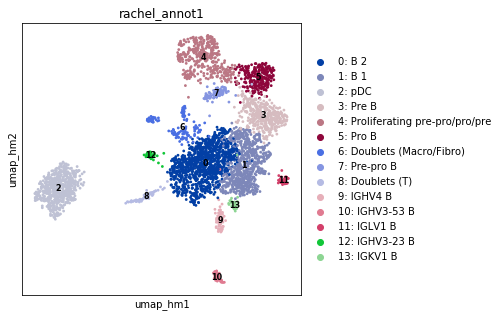

In [146]:
ss.lib.set_figsize((5,5))
ss.lib.plot_embedding(ad1, basis='umap_hm', groupby='rachel_annot1')

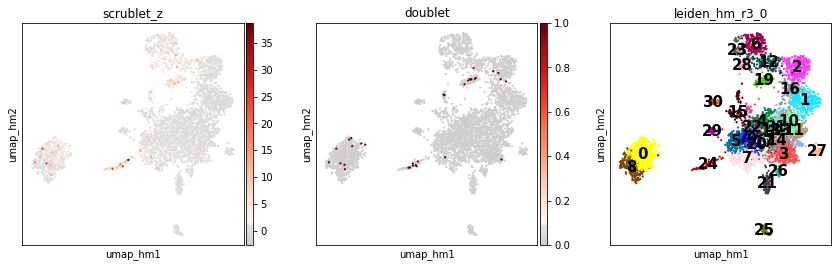

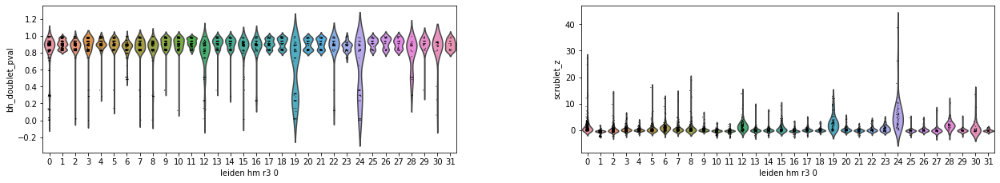

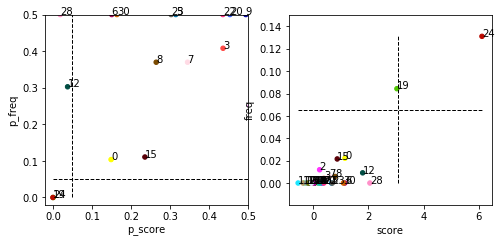

In [142]:
df = check_doublets(ad1, 'leiden_hm_r3_0', basis='umap_hm', p='bh_doublet_pval', score='scrublet_z', initial_pmin=0.05, size=20, legend_loc='on data', legend_fontsize=15, figsize=4)

In [66]:
ad1.obs['pooled_doublet'] = ad1.obs['leiden_hm_r3_0'].isin(['24'])

In [67]:
ad1.write(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}_processed.h5ad', compression='lzf')

# 8. Trajectory

In [69]:
ad1n = ad1[~ad1.obs['pooled_doublet'] & (~ad1.obs.rachel_annot1.str.startswith('Doublets')), :]

In [70]:
ad1n

View of AnnData object with n_obs × n_vars = 3673 × 16446 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', 'leiden_hm_r0_6', 'leiden_hm_r0_7', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', '__is_in_cluster__', 'leiden_hm_nocc_r0_1', 'leiden_hm_nocc_r0_2', 'leiden_hm_nocc_r0_3', 'leiden_hm_nocc_r0_4', 'leiden_bk_nocc_r0_1', 'leiden_bk_nocc_r0_2', 'leiden_bk_nocc_r0_3', 'leiden_bk_nocc_r0_4', 'leiden_hm_nocc_r0_5', 'leiden_bk_nocc_r0_5', 'rachel_annot1', 'leiden_hm_r3_0', 'scrublet_z', 'cluster_scrublet_z', 

In [132]:
# ad1n_1 = ad1n
# ad1n_1 = ad1n.copy()[(ad1n.obs.rachel_annot1!='pDC') & (ad1n.obs.leiden_hm_nocc_r0_5!='2') & (ad1n.obs.leiden_bk_r0_5!='1') & (ad1n.obs.leiden_bk_nocc_r0_5!='2'), :]
ad1n_1 = ad1n.copy()[(ad1n.obs.rachel_annot1!='pDC') & (ad1n.obs.leiden_hm_nocc_r0_5!='2') & (ad1n.obs.leiden_bk_r0_5!='1') & (ad1n.obs.leiden_bk_nocc_r0_5!='2') & (ad1n.obs.leiden_hm_r3_0!='19'), :]

In [133]:
ss.lib.leiden(ad1n_1, use_graph='neighbors_hm_nocc', resolution=[0.6, 0.7], key_added='hm_nocc')
ss.lib.leiden(ad1n_1, use_graph='neighbors_bk', resolution=[0.6, 0.7], key_added='bk')
ss.lib.leiden(ad1n_1, use_graph='neighbors_bk_nocc', resolution=[0.6, 0.7], key_added='bk_nocc')

['leiden_bk_nocc_r0_6', 'leiden_bk_nocc_r0_7']

In [135]:
ad1n_1 = ad1n_1[(ad1n_1.obs.leiden_bk_r0_6!='11') & ~ad1n_1.obs.leiden_bk_nocc_r0_6.isin(['7', '9', '10']), :]

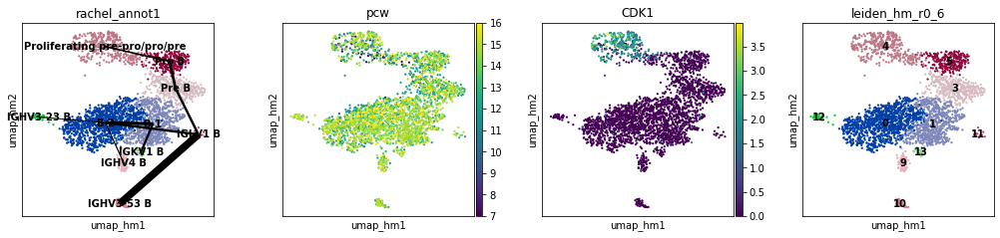

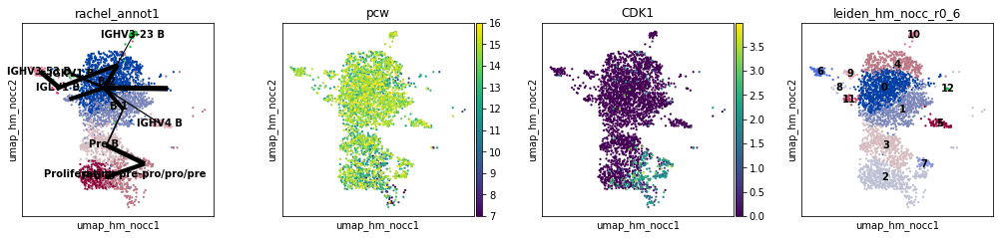

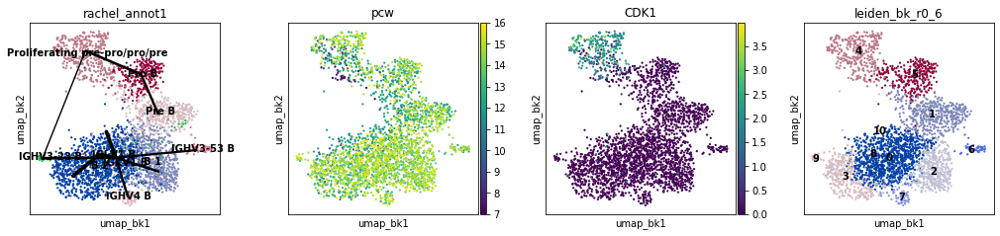

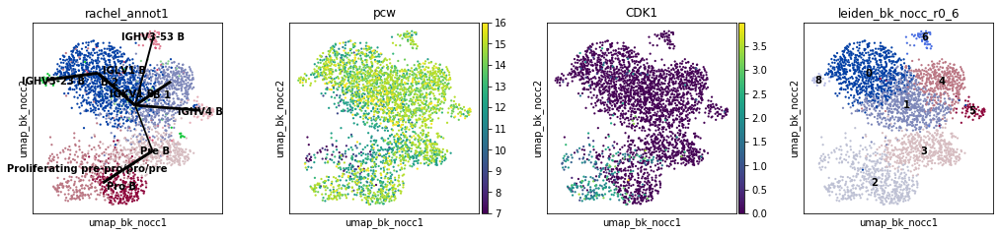

In [136]:
ss.lib.set_figsize((3.5, 3.5))

ss.lib.paga(ad1n_1, use_graph='neighbors_hm', key_added='hm', groups='rachel_annot1')
ss.lib.plot_paga(ad1n_1, basis='umap_hm', use_key='paga_hm', layout='fa', color=['rachel_annot1', 'pcw', 'CDK1', 'leiden_hm_r0_6'],
                 edge_width_scale=1, solid_edges='connectivities_tree', size=20)

ss.lib.paga(ad1n_1, use_graph='neighbors_hm_nocc', key_added='hm_nocc', groups='leiden_hm_nocc_r0_6')
ss.lib.plot_paga(ad1n_1, basis='umap_hm_nocc', use_key='paga_hm_nocc', layout='fa', color=['rachel_annot1', 'pcw', 'CDK1', 'leiden_hm_nocc_r0_6'],
                 edge_width_scale=1, solid_edges='connectivities_tree', size=20)

ss.lib.paga(ad1n_1, use_graph='neighbors_bk', key_added='bk', groups='leiden_bk_r0_6')
ss.lib.plot_paga(ad1n_1, basis='umap_bk', use_key='paga_bk', layout='fa', color=['rachel_annot1', 'pcw', 'CDK1', 'leiden_bk_r0_6'],
                 edge_width_scale=0.5, solid_edges='connectivities_tree', size=20)

ss.lib.paga(ad1n_1, use_graph='neighbors_bk_nocc', key_added='bk_nocc', groups='leiden_bk_nocc_r0_6')
ss.lib.plot_paga(ad1n_1, basis='umap_bk_nocc', use_key='paga_bk_nocc', layout='fa', color=['rachel_annot1', 'pcw', 'CDK1', 'leiden_bk_nocc_r0_6'],
                 root=4, edge_width_scale=0.5, solid_edges='connectivities_tree', size=20)

In [140]:
# ad1n_1 = ad1n
ad1n_2 = ad1n_1.copy()[(~ad1n_1.obs.rachel_annot1.str.startswith('Proliferating')) & (ad1n_1.obs.leiden_bk_r0_6!='4'), :]

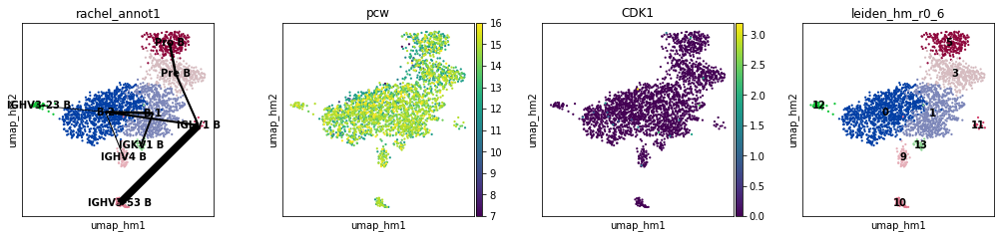

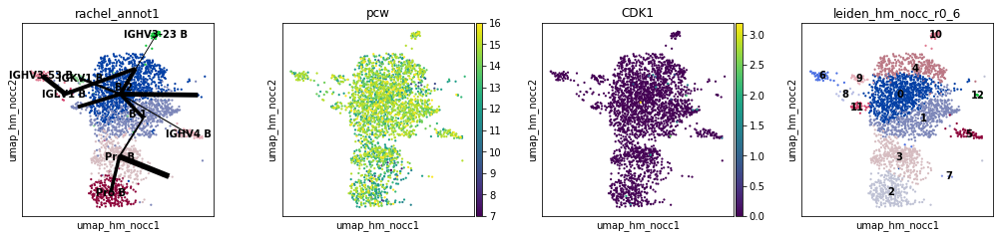

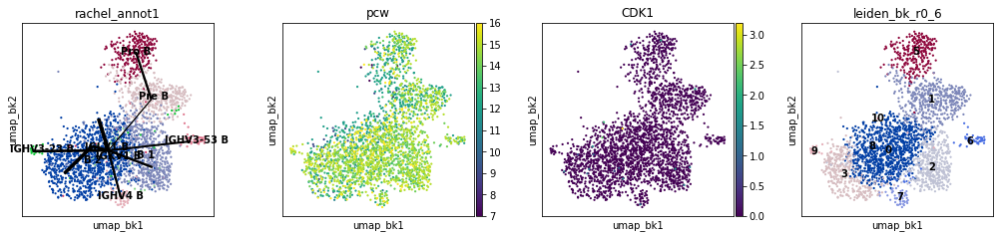

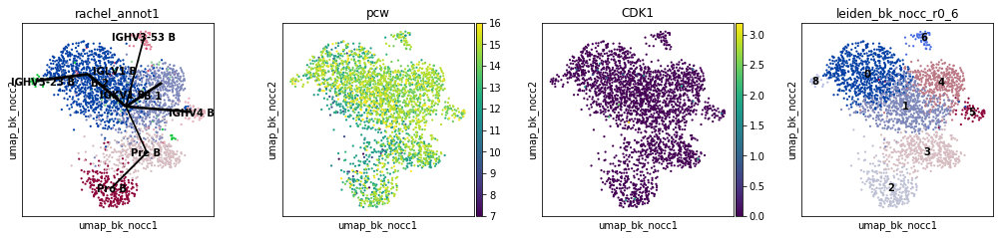

In [141]:
ss.lib.set_figsize((3.5, 3.5))

ss.lib.paga(ad1n_2, use_graph='neighbors_hm', key_added='hm', groups='rachel_annot1')
ss.lib.plot_paga(ad1n_2, basis='umap_hm', use_key='paga_hm', layout='fa', color=['rachel_annot1', 'pcw', 'CDK1', 'leiden_hm_r0_6'],
                 edge_width_scale=1, solid_edges='connectivities_tree', size=20)

ss.lib.paga(ad1n_2, use_graph='neighbors_hm_nocc', key_added='hm_nocc', groups='leiden_hm_nocc_r0_6')
ss.lib.plot_paga(ad1n_2, basis='umap_hm_nocc', use_key='paga_hm_nocc', layout='fa', color=['rachel_annot1', 'pcw', 'CDK1', 'leiden_hm_nocc_r0_6'],
                 edge_width_scale=1, solid_edges='connectivities_tree', size=20)

ss.lib.paga(ad1n_2, use_graph='neighbors_bk', key_added='bk', groups='leiden_bk_r0_6')
ss.lib.plot_paga(ad1n_2, basis='umap_bk', use_key='paga_bk', layout='fa', color=['rachel_annot1', 'pcw', 'CDK1', 'leiden_bk_r0_6'],
                 edge_width_scale=0.5, solid_edges='connectivities_tree', size=20)

ss.lib.paga(ad1n_2, use_graph='neighbors_bk_nocc', key_added='bk_nocc', groups='leiden_bk_nocc_r0_6')
ss.lib.plot_paga(ad1n_2, basis='umap_bk_nocc', use_key='paga_bk_nocc', layout='fa', color=['rachel_annot1', 'pcw', 'CDK1', 'leiden_bk_nocc_r0_6'],
                 root=4, edge_width_scale=0.5, solid_edges='connectivities_tree', size=20)

In [55]:
ad1n.write(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}_processed_nodoublet_paga.h5ad', compression='lzf')